In [30]:
import os

os.environ["PYDEVD_DISABLE_FILE_VALIDATION"] = "1"

In [31]:
import pandas as pd
import numpy as np
from itertools import product
import pickle
import math
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from datetime import datetime, timedelta
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.gridspec import GridSpec

In [32]:
def get_analysis_df(data_path, pred_path, coord_path):
    """Match original data to predictions and corresponding coordinates.

    Parameters
    ----------
    data_path : str
        path to original processed data dictionnary
    pred_path : str
        path to predictions dictionnary
    coord_path : str
        path to dataframe matching location index to coordinates

    Returns
    -------
    pd.Dataframe
        dataframe with groundtruth values, predictions and corresponding time and coordinates

    """

    with open(data_path, "rb") as fp:
        data = pickle.load(fp)
    with open(pred_path, "rb") as fp_2:
        preds = pickle.load(fp_2)

    coords = pd.read_parquet(coord_path)
    coords = coords.drop_duplicates()

    # get location ID and grountruth CSIF from original data
    df = pd.DataFrame(
        {
            "Index": data["data_sets"]["test"]["id"].flatten(),
            "Flattened_Values": data["data_sets"]["test"]["target"].flatten(),
        }
    )
    # retrive future drivers map from predictions
    df["pred_05"] = preds["predicted_quantiles"][:, :, 1].flatten()
    df[["location_id", "time_id"]] = df["Index"].str.split("_", n=1, expand=True)
    df["location_id"] = df["location_id"].astype(int)
    df["time_id"] = pd.to_datetime(df["time_id"])
    df = df.sort_values(by=["location_id", "time_id"])
    df["doy"] = df["time_id"].dt.dayofyear
    df["year"] = df["time_id"].dt.year
    df["month"] = df["time_id"].dt.month
    df["day"] = df["time_id"].dt.day
    df = df.rename(
        columns={
            "Flattened_Values": "CSIF",
            "location_id": "location",
            "time_id": "time",
        }
    )
    df = df.drop(columns=["Index"])
    df = pd.merge(coords, df, on="location", how="left")

    fp.close()
    fp_2.close()

    return df


def localize_df(df, latitude_range, longitude_range):
    df = df[df["latitude"] > latitude_range[0]]
    df = df[df["latitude"] < latitude_range[1]]
    print("max", max(df["latitude"]))
    print("min", min(df["latitude"]))
    print("median", df["latitude"].median())
    print("mean", df["latitude"].median())

    df = df[df["longitude"] > longitude_range[0]]
    df = df[df["longitude"] < longitude_range[1]]
    return df


def start_of_growing_season(df):
    latitude = df["latitude"].median()
    print("median", latitude)

    if latitude > 70 or latitude < -70:
        return None  # Growing season not defined for these latitudes

    # Northern Hemisphere
    if 56 <= latitude <= 70:
        return [6]
    elif 50 <= latitude < 56:
        return [4, 5]
    elif 40 <= latitude < 50:
        return [4]
    elif 30 <= latitude < 40:
        return [2, 3]
    elif 10 <= latitude < 30:
        return [3]
    elif 0 <= latitude < 10:
        return [3]

    # Southern Hemisphere
    if -10 <= latitude < 0:
        return [8]
    elif -30 <= latitude < -10:
        return [8, 9]
    elif -40 <= latitude < -30:
        return [8, 9]
    elif -50 <= latitude < -40:
        return [9, 10]
    elif -60 <= latitude < -50:
        return [9, 10]
    elif -70 <= latitude < -60:
        return [12, 1]

    return None


def end_of_growing_season(df):
    latitude = df["latitude"].median()

    if 90 >= latitude > 60:
        return [9]
    elif 60 >= latitude > 50:
        return [9, 10]
    elif 50 >= latitude > 20:
        return [10]
    elif 20 >= latitude > 10:
        return [10, 11]
    elif 10 >= latitude > 0:
        return [12]
    elif 0 >= latitude > -12:
        return [7]
    elif -12 >= latitude > -20:
        return [5]
    elif -20 >= latitude > -30:
        return [4, 5]
    elif -30 >= latitude > -60:
        return [4]
    else:
        raise ValueError("Latitude is out of the specified range")


def find_date_range(df, season, specific_year=None):
    """
    This function is meant to iterate between different date windows of 2-3 days
    whithin a month window to find a start date of the predicted time series
    with at least 20 sites sharing the same start date for a given year.

        output: indexes of time series of interest.


    """
    if season == "eos":
        months = end_of_growing_season(df)
    elif season == "sos":
        months = start_of_growing_season(df)

    if len(months) > 2:
        print("Equator median latitude, no SOS/EOS Date range")
        return None, None

    # given the month window, specify the start date and end date
    # if given two months set the start day to the 15th
    if len(months) == 2:
        start_month = months[0]
        start_day = 15
        end_month = months[1]
        end_day = 15
    else:
        start_month = months[0]
        start_day = 1
        end_month = months[0] + 1
        if end_month == 13:
            end_month = 1
        end_day = 1
    # loop for all available years
    for year in range(2002, 2011):
        if specific_year is not None:
            year = specific_year

        dt_start = datetime(year, start_month, start_day)
        if (
            start_month != end_month and end_month == 1
        ):  # when looking at december and january
            year_2 = year + 1
            dt_end = datetime(year_2, end_month, end_day)
            df_current_year = df[df["year"] >= year]
            df_current_year = df_current_year[df_current_year["year"] <= year_2]
        else:
            dt_end = datetime(year, end_month, end_day)
            df_current_year = df[df["year"] == year]

        # FILTER FOR THAT TIME PERIOD
        window_end = dt_start + timedelta(days=3)
        counter = 0
        index_threshold = 7
        while window_end < dt_end:
            window_start = dt_start + timedelta(days=counter)
            window_end = dt_start + timedelta(days=counter + 3)
            counter += 1
            filtered_df = df_current_year.groupby("location").filter(
                lambda x: (x["time"].iloc[0] >= window_start)
                and (x["time"].iloc[0] <= window_end)
            )
            indices_array = np.unique(filtered_df[::30].index.to_numpy())
            select_indices = np.round(indices_array / 30).astype(int)
            if len(select_indices) > index_threshold:
                print("window:", window_start, ",", window_end)
                return select_indices, window_start

    # loop for a sliding window whitin the SOS date range
    # if sites number is greater than 20, select that date


def plot_featimp(df, pred_path, data_path, season, specific_year=None, title=""):
    with open(pred_path, "rb") as fp:
        preds = pickle.load(fp)

    csif_list = []

    tmin_list = []
    tmax_list = []
    rad_list = []
    precip_list = []
    photo_list = []
    SM_list = []

    select_indices, window_start = find_date_range(df, season, specific_year)
    print(select_indices)
    # FEATURE IMPORTANCE DATA
    for index in select_indices:
        csif_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 0]),
                    np.zeros(30),
                ]
            )
        )
        tmin_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 1]),
                    np.array(preds["future_selection_weights"][index][:, 0]),
                ],
                axis=0,
            )
        )
        tmax_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 2]),
                    np.array(preds["future_selection_weights"][index][:, 1]),
                ],
                axis=0,
            )
        )
        rad_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 3]),
                    np.array(preds["future_selection_weights"][index][:, 2]),
                ],
                axis=0,
            )
        )
        precip_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 4]),
                    np.array(preds["future_selection_weights"][index][:, 3]),
                ],
                axis=0,
            )
        )
        photo_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 5]),
                    np.array(preds["future_selection_weights"][index][:, 4]),
                ],
                axis=0,
            )
        )
        SM_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 6]),
                    np.array(preds["future_selection_weights"][index][:, 5]),
                ],
                axis=0,
            )
        )

    fp.close()

    stacked_csif = np.stack(csif_list, axis=0)
    stacked_tmin = np.stack(tmin_list, axis=0)
    stacked_tmax = np.stack(tmax_list, axis=0)
    stacked_rad = np.stack(rad_list, axis=0)
    stacked_precip = np.stack(precip_list, axis=0)
    stacked_photo = np.stack(photo_list, axis=0)
    stacked_SM = np.stack(SM_list, axis=0)

    mean_csif = np.mean(stacked_csif, axis=0)
    mean_tmin = np.mean(stacked_tmin, axis=0)
    mean_tmax = np.mean(stacked_tmax, axis=0)
    mean_rad = np.mean(stacked_rad, axis=0)
    mean_precip = np.mean(stacked_precip, axis=0)
    mean_photo = np.mean(stacked_photo, axis=0)
    mean_SM = np.mean(stacked_SM, axis=0)

    # TIMESERIES  DATA

    with open(data_path, "rb") as fp:
        data = pickle.load(fp)

    csif_pred = []
    csif_ts = []
    tmin_ts = []
    tmax_ts = []
    rad_ts = []
    precip_ts = []
    photo_ts = []
    SM_ts = []

    for index in select_indices:
        csif_pred.append(
            np.array(preds["predicted_quantiles"][:, :, 1][index].flatten())
        )
        csif_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 0]
                    ),
                    np.array(data["data_sets"]["test"]["target"][index]),
                ],
                axis=0,
            )
        )
        tmin_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 1]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 0]
                    ),
                ],
                axis=0,
            )
        )
        tmax_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 2]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 1]
                    ),
                ],
                axis=0,
            )
        )
        rad_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 3]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 2]
                    ),
                ],
                axis=0,
            )
        )
        precip_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 4]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 3]
                    ),
                ],
                axis=0,
            )
        )
        photo_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 5]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 4]
                    ),
                ],
                axis=0,
            )
        )
        SM_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 6]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 5]
                    ),
                ],
                axis=0,
            )
        )

    fp.close()

    stacked_csif_ts = np.stack(csif_ts, axis=0)
    stacked_csif_pred = np.stack(csif_pred, axis=0)
    stacked_tmin_ts = np.stack(tmin_ts, axis=0)
    stacked_tmax_ts = np.stack(tmax_ts, axis=0)
    stacked_rad_ts = np.stack(rad_ts, axis=0)
    stacked_precip_ts = np.stack(precip_ts, axis=0)
    stacked_photo_ts = np.stack(photo_ts, axis=0)
    stacked_SM_ts = np.stack(SM_ts, axis=0)

    csif_mean_array = np.mean(stacked_csif_ts, axis=0)
    # csif_mean_array = (csif_mean_array - csif_mean_array.min()) / (csif_mean_array.max() - csif_mean_array.min())

    csif_pred_mean_array = np.mean(stacked_csif_pred, axis=0)
    # csif_pred_mean_array = (csif_pred_mean_array - csif_mean_array.min()) / (csif_mean_array.max() - csif_mean_array.min())

    combined = np.concatenate((csif_mean_array, csif_pred_mean_array))
    min_val = combined.min()
    max_val = combined.max()

    # Normalize the time series
    csif_mean_array = (csif_mean_array - min_val) / (max_val - min_val)
    csif_pred_mean_array = (csif_pred_mean_array - min_val) / (max_val - min_val)

    tmin_mean_array = np.mean(stacked_tmin_ts, axis=0)
    tmax_mean_array = np.mean(stacked_tmax_ts, axis=0)
    rad_mean_array = np.mean(stacked_rad_ts, axis=0)
    precip_mean_array = np.mean(stacked_precip_ts, axis=0)
    photo_mean_array = np.mean(stacked_photo_ts, axis=0)
    SM_mean_array = np.mean(stacked_SM_ts, axis=0)

    timeseries_dict = {
        "CSIF": csif_mean_array,
        "Tmin": tmin_mean_array,
        "Tmax": tmax_mean_array,
        "SR": rad_mean_array,
        "PR": precip_mean_array,
        "PP": photo_mean_array,
        "SM": SM_mean_array,
    }

    # Sample DataFrame creation
    data_f = {
        "CSIF": mean_csif,
        "Tmin": mean_tmin,
        "Tmax": mean_tmax,
        "SR": mean_rad,
        "PR": mean_precip,
        "PP": mean_photo,
        "SM": mean_SM,
    }

    df_f = pd.DataFrame(data_f)

    # Sort features based on the maximum value of each column

    # Set the figure size for subplots
    plt.figure(figsize=(17, 4))

    date_range = pd.date_range(start=window_start, periods=395, freq="D")
    df_dates = pd.DataFrame({"Date": date_range})
    df_dates["Index"] = df_dates.index
    first_day_of_months = df_dates[df_dates["Date"].dt.is_month_start]["Index"].tolist()

    month_labels = []
    date_range = pd.date_range(
        start=window_start, periods=len(first_day_of_months) + 1, freq="M"
    )
    for date in date_range:
        month_labels.append(date.strftime("%b"))
    month_labels = month_labels[1:]

    cmap0 = LinearSegmentedColormap.from_list("", ["white", "red"])

    vertical_line_position = 365
    ax = plt.subplot(8, 1, 1)
    ax.set_title(title + " " + str(window_start))

    # plot csif
    heatmap_data = df_f[["CSIF"]].transpose()
    timeseries = timeseries_dict["CSIF"]
    # Plotting the heatmap for each feature
    sns.heatmap(
        heatmap_data,
        cmap="gnuplot2_r",
        vmax=0.7,
        annot=False,
        fmt=".2f",
        linewidths=0,
        cbar=True,
    )
    ax.plot(timeseries)
    ax.plot(np.arange(366, 396), csif_pred_mean_array, color="red")
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.set_title("")
    ax.set_xlabel("")
    ax.invert_yaxis()

    df_f = df_f.drop("CSIF", axis=1)
    sorted_features = df_f.iloc[:, :].max().sort_values(ascending=False).index.tolist()

    for i, feature in enumerate(sorted_features, 1):
        ax = plt.subplot(8, 1, i + 1)

        # Reshape the DataFrame for each feature's heatmap
        heatmap_data = df_f[[feature]].transpose()
        timeseries = timeseries_dict[feature]

        # Plotting the heatmap for each feature
        sns.heatmap(
            heatmap_data,
            cmap="gnuplot2_r",
            vmax=0.7,
            annot=False,
            fmt=".2f",
            linewidths=0,
            cbar=True,
        )
        if i < 6:
            # Remove x-axis labels and ticks
            ax.set_xticks([])
            ax.set_xticklabels([])

        ax.plot(timeseries)
        ax.axvline(x=365, color="black", linestyle="--", linewidth=1)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_title("")
        ax.set_xlabel("")
        ax.invert_yaxis()

        # Remove y-axis label
        ax.set_ylabel("")

    # Remove vertical space between subplots
    ax.set_xticks(first_day_of_months)
    ax.set_xticklabels(month_labels, ha="right")
    # ax.set_xticklabels(df_f['DOY'][::30])
    plt.tight_layout(pad=0, w_pad=0, h_pad=0)
    plt.xlabel("Time")
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.savefig("feature_importance_plots/" + title + ".png", format="png", dpi=300)

    # Show the plot
    plt.show()


# Install geopy if you haven't already
# !pip install geopy

from geopy.geocoders import Nominatim


def get_city_bounding_box(city_name):
    """
    Given a city name, returns two tuples: the latitude and longitude range of a box around that city.
    The box extends 10 degrees north and south, and 30 degrees east and west from the city.

    Parameters:
    city_name (str): The name of the city.

    Returns:
    tuple: A tuple containing two tuples:
           - Latitude range (min_lat, max_lat)
           - Longitude range (min_lon, max_lon)
    """
    # Initialize geocoder
    geolocator = Nominatim(user_agent="city_bounding_box")

    # Get the location of the city
    location = geolocator.geocode(city_name)

    if location is None:
        raise ValueError(f"City '{city_name}' not found.")

    # Get the latitude and longitude of the city
    lat = location.latitude
    lon = location.longitude

    # Calculate the latitude and longitude ranges
    min_lat = lat - 10
    max_lat = lat + 10
    min_lon = lon - 20
    max_lon = lon + 20

    # Return the latitude and longitude range as two tuples
    return ((min_lat, max_lat), (min_lon, max_lon))


def plot_attention(df, pred_path, season, specific_year=2006, title=" "):
    with open(pred_path, "rb") as fp:
        preds = pickle.load(fp)
    select_indices, window_start = find_date_range(df, season, specific_year)

    date_range = pd.date_range(start=window_start, periods=395, freq="D")
    df_dates = pd.DataFrame({"Date": date_range})
    df_dates["Index"] = df_dates.index
    first_day_of_months = df_dates[df_dates["Date"].dt.is_month_start]["Index"].tolist()

    month_labels = []
    date_range = pd.date_range(
        start=window_start, periods=len(first_day_of_months) + 1, freq="M"
    )
    for date in date_range:
        month_labels.append(date.strftime("%b"))
    month_labels = month_labels[1:]

    att_mat_list = []
    for index in select_indices:
        att_mat_list.append(preds["attention_scores"][index])
    stacked_att = np.stack(att_mat_list, axis=0)
    att_mean_array = np.mean(stacked_att, axis=0)

    plt.figure(figsize=(20, 3))
    cmap0 = LinearSegmentedColormap.from_list("", ["white", "red"])
    sns.heatmap(
        att_mean_array, cmap=cmap0
    )  # You can choose different colormaps like 'coolwarm', 'Blues', etc.
    plt.axvline(x=365, color="black", linestyle="--", linewidth=1)
    # Adding titles and labels as needed
    plt.xlabel("Time")
    plt.ylabel("Horizon")
    # Set the x-axis tick positions
    tick_positions = range(0, 396)[::5]
    # Set the custom tick labels
    custom_tick_labels = range(-365, 31)[::5]
    # Set the tick labels
    plt.xticks(first_day_of_months, month_labels)
    plt.title(title + " " + str(window_start))

    # Show the plot
    plt.savefig(
        "feature_importance_plots/attention" + title + ".png", format="png", dpi=300
    )

    plt.show()


def check_latitude_interval(lat_tuple):
    """
    Given a latitude tuple, check in which interval the mean latitude falls and return the corresponding interval string.

    Parameters:
    lat_tuple (tuple): A tuple representing the latitude range (min_lat, max_lat).

    Returns:
    str: A string representing the latitude interval.
    """
    min_lat, max_lat = lat_tuple

    # Calculate the mean latitude
    mean_lat = (min_lat + max_lat) / 2

    # Check which interval the mean latitude falls into and return the corresponding string
    if 50 <= mean_lat <= 90:
        return "50_90"
    elif 20 <= mean_lat < 50:
        return "50_20"
    elif -20 <= mean_lat < 20:
        return "-20_20"
    elif -60 <= mean_lat < -20:
        return "-20_-60"
    else:
        return "Out of range"  # Optional: Handle cases where the latitude is out of the specified ranges


def main_feature_map(city):
    latitude_range, longitude_range = get_city_bounding_box(city)
    lat_range_path = check_latitude_interval(latitude_range)
    print(lat_range_path)
    data_path = "/burg/glab/users/al4385/data/TFT_30/BDT_" + lat_range_path + ".pickle"
    pred_path = (
        "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_BDT_"
        + lat_range_path
        + ".pkl"
    )
    coord_path = (
        "/burg/glab/users/al4385/data/coordinates/BDT_" + lat_range_path + ".parquet"
    )
    df = get_analysis_df(data_path, pred_path, coord_path)
    df = localize_df(df, latitude_range, longitude_range)
    plot_featimp(df, pred_path, data_path, season, specific_year=None, title=city)
    plot_attention(df, pred_path, season, specific_year=None, title=city)

In [40]:
def get_analysis_df(data_path, pred_path, coord_path):
    """Match original data to predictions and corresponding coordinates.

    Parameters
    ----------
    data_path : str
        path to original processed data dictionnary
    pred_path : str
        path to predictions dictionnary
    coord_path : str
        path to dataframe matching location index to coordinates

    Returns
    -------
    pd.Dataframe
        dataframe with groundtruth values, predictions and corresponding time and coordinates

    """

    with open(data_path, "rb") as fp:
        data = pickle.load(fp)
    with open(pred_path, "rb") as fp_2:
        preds = pickle.load(fp_2)

    coords = pd.read_parquet(coord_path)
    coords = coords.drop_duplicates()

    # get location ID and grountruth CSIF from original data
    df = pd.DataFrame(
        {
            "Index": data["data_sets"]["test"]["id"].flatten(),
            "Flattened_Values": data["data_sets"]["test"]["target"].flatten(),
        }
    )
    # retrive future drivers map from predictions
    df["pred_05"] = preds["predicted_quantiles"][:, :, 1].flatten()
    df[["location_id", "time_id"]] = df["Index"].str.split("_", n=1, expand=True)
    df["location_id"] = df["location_id"].astype(int)
    df["time_id"] = pd.to_datetime(df["time_id"])
    df = df.sort_values(by=["location_id", "time_id"])
    df["doy"] = df["time_id"].dt.dayofyear
    df["year"] = df["time_id"].dt.year
    df["month"] = df["time_id"].dt.month
    df["day"] = df["time_id"].dt.day
    df = df.rename(
        columns={
            "Flattened_Values": "CSIF",
            "location_id": "location",
            "time_id": "time",
        }
    )
    df = df.drop(columns=["Index"])
    df = pd.merge(coords, df, on="location", how="left")

    fp.close()
    fp_2.close()

    return df


def localize_df(df, latitude_range, longitude_range):
    df = df[df["latitude"] > latitude_range[0]]
    df = df[df["latitude"] < latitude_range[1]]
    print("max", max(df["latitude"]))
    print("min", min(df["latitude"]))
    print("median", df["latitude"].median())
    print("mean", df["latitude"].median())

    df = df[df["longitude"] > longitude_range[0]]
    df = df[df["longitude"] < longitude_range[1]]
    return df


def start_of_growing_season(df):
    latitude = df["latitude"].median()
    print("median", latitude)

    if latitude > 70 or latitude < -70:
        return None  # Growing season not defined for these latitudes

    # Northern Hemisphere
    if 56 <= latitude <= 70:
        return [6]
    elif 50 <= latitude < 56:
        return [4, 5]
    elif 40 <= latitude < 50:
        return [4]
    elif 30 <= latitude < 40:
        return [2, 3]
    elif 10 <= latitude < 30:
        return [3]
    elif 0 <= latitude < 10:
        return [3]

    # Southern Hemisphere
    if -10 <= latitude < 0:
        return [8]
    elif -30 <= latitude < -10:
        return [8, 9]
    elif -40 <= latitude < -30:
        return [8, 9]
    elif -50 <= latitude < -40:
        return [9, 10]
    elif -60 <= latitude < -50:
        return [9, 10]
    elif -70 <= latitude < -60:
        return [12, 1]

    return None


def end_of_growing_season(df):
    latitude = df["latitude"].median()

    if 90 >= latitude > 60:
        return [9]
    elif 60 >= latitude > 50:
        return [9, 10]
    elif 50 >= latitude > 20:
        return [10]
    elif 20 >= latitude > 10:
        return [10, 11]
    elif 10 >= latitude > 0:
        return [12]
    elif 0 >= latitude > -12:
        return [7]
    elif -12 >= latitude > -20:
        return [5]
    elif -20 >= latitude > -30:
        return [4, 5]
    elif -30 >= latitude > -60:
        return [4]
    else:
        raise ValueError("Latitude is out of the specified range")


def find_date_range(df, season, specific_year=None):
    """
    This function is meant to iterate between different date windows of 2-3 days
    whithin a month window to find a start date of the predicted time series
    with at least 20 sites sharing the same start date for a given year.

        output: indexes of time series of interest.


    """
    if season == "eos":
        months = end_of_growing_season(df)
    elif season == "sos":
        months = start_of_growing_season(df)

    if len(months) > 2:
        print("Equator median latitude, no SOS/EOS Date range")
        return None, None

    # given the month window, specify the start date and end date
    # if given two months set the start day to the 15th
    if len(months) == 2:
        start_month = months[0]
        start_day = 15
        end_month = months[1]
        end_day = 15
    else:
        start_month = months[0]
        start_day = 1
        end_month = months[0] + 1
        if end_month == 13:
            end_month = 1
        end_day = 1
    # loop for all available years
    for year in range(2002, 2011):
        if specific_year is not None:
            year = specific_year

        dt_start = datetime(year, start_month, start_day)
        if (
            start_month != end_month and end_month == 1
        ):  # when looking at december and january
            year_2 = year + 1
            dt_end = datetime(year_2, end_month, end_day)
            df_current_year = df[df["year"] >= year]
            df_current_year = df_current_year[df_current_year["year"] <= year_2]
        else:
            dt_end = datetime(year, end_month, end_day)
            df_current_year = df[df["year"] == year]

        # FILTER FOR THAT TIME PERIOD
        window_end = dt_start + timedelta(days=3)
        counter = 0
        index_threshold = 7
        while window_end < dt_end:
            window_start = dt_start + timedelta(days=counter)
            window_end = dt_start + timedelta(days=counter + 3)
            counter += 1
            filtered_df = df_current_year.groupby("location").filter(
                lambda x: (x["time"].iloc[0] >= window_start)
                and (x["time"].iloc[0] <= window_end)
            )
            indices_array = np.unique(filtered_df[::30].index.to_numpy())
            select_indices = np.round(indices_array / 30).astype(int)
            if len(select_indices) > index_threshold:
                print("window:", window_start, ",", window_end)
                return select_indices, window_start

    # loop for a sliding window whitin the SOS date range
    # if sites number is greater than 20, select that date


def plot_featimp(df, pred_path, data_path, season, specific_year=None, title=""):
    with open(pred_path, "rb") as fp:
        preds = pickle.load(fp)

    csif_list = []

    tmin_list = []
    tmax_list = []
    rad_list = []
    precip_list = []
    photo_list = []
    SM_list = []

    select_indices, window_start = find_date_range(df, season, specific_year)
    print(select_indices)
    # FEATURE IMPORTANCE DATA
    for index in select_indices:
        # csif_list.append(np.concatenate([np.array(preds['historical_selection_weights'][index][:,0]), np.zeros(30)]))
        tmin_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 1]),
                    np.array(preds["future_selection_weights"][index][:, 0]),
                ],
                axis=0,
            )
        )
        tmax_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 2]),
                    np.array(preds["future_selection_weights"][index][:, 1]),
                ],
                axis=0,
            )
        )
        rad_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 3]),
                    np.array(preds["future_selection_weights"][index][:, 2]),
                ],
                axis=0,
            )
        )
        precip_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 4]),
                    np.array(preds["future_selection_weights"][index][:, 3]),
                ],
                axis=0,
            )
        )
        photo_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 5]),
                    np.array(preds["future_selection_weights"][index][:, 4]),
                ],
                axis=0,
            )
        )
        SM_list.append(
            np.concatenate(
                [
                    np.array(preds["historical_selection_weights"][index][:, 6]),
                    np.array(preds["future_selection_weights"][index][:, 5]),
                ],
                axis=0,
            )
        )

    fp.close()

    # stacked_csif= np.stack(csif_list, axis=0)
    stacked_tmin = np.stack(tmin_list, axis=0)
    stacked_tmax = np.stack(tmax_list, axis=0)
    stacked_rad = np.stack(rad_list, axis=0)
    stacked_precip = np.stack(precip_list, axis=0)
    stacked_photo = np.stack(photo_list, axis=0)
    stacked_SM = np.stack(SM_list, axis=0)

    # mean_csif= np.mean(stacked_csif, axis=0)
    mean_tmin = np.mean(stacked_tmin, axis=0)
    mean_tmax = np.mean(stacked_tmax, axis=0)
    mean_rad = np.mean(stacked_rad, axis=0)
    mean_precip = np.mean(stacked_precip, axis=0)
    mean_photo = np.mean(stacked_photo, axis=0)
    mean_SM = np.mean(stacked_SM, axis=0)

    # TIMESERIES  DATA

    with open(data_path, "rb") as fp:
        data = pickle.load(fp)

    csif_pred = []
    csif_ts = []
    tmin_ts = []
    tmax_ts = []
    rad_ts = []
    precip_ts = []
    photo_ts = []
    SM_ts = []

    for index in select_indices:
        csif_pred.append(
            np.array(preds["predicted_quantiles"][:, :, 1][index].flatten())
        )
        csif_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 0]
                    ),
                    np.array(data["data_sets"]["test"]["target"][index]),
                ],
                axis=0,
            )
        )
        tmin_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 1]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 0]
                    ),
                ],
                axis=0,
            )
        )
        tmax_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 2]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 1]
                    ),
                ],
                axis=0,
            )
        )
        rad_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 3]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 2]
                    ),
                ],
                axis=0,
            )
        )
        precip_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 4]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 3]
                    ),
                ],
                axis=0,
            )
        )
        photo_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 5]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 4]
                    ),
                ],
                axis=0,
            )
        )
        SM_ts.append(
            np.concatenate(
                [
                    np.array(
                        data["data_sets"]["test"]["historical_ts_numeric"][index][:, 6]
                    ),
                    np.array(
                        data["data_sets"]["test"]["future_ts_numeric"][index][:, 5]
                    ),
                ],
                axis=0,
            )
        )

    fp.close()

    stacked_csif_ts = np.stack(csif_ts, axis=0)
    stacked_csif_pred = np.stack(csif_pred, axis=0)
    stacked_tmin_ts = np.stack(tmin_ts, axis=0)
    stacked_tmax_ts = np.stack(tmax_ts, axis=0)
    stacked_rad_ts = np.stack(rad_ts, axis=0)
    stacked_precip_ts = np.stack(precip_ts, axis=0)
    stacked_photo_ts = np.stack(photo_ts, axis=0)
    stacked_SM_ts = np.stack(SM_ts, axis=0)

    csif_mean_array = np.mean(stacked_csif_ts, axis=0)

    csif_pred_mean_array = np.mean(stacked_csif_pred, axis=0)

    combined = np.concatenate((csif_mean_array, csif_pred_mean_array))
    min_val = combined.min()
    max_val = combined.max()

    # Normalize the time series
    csif_mean_array = (csif_mean_array - min_val) / (max_val - min_val)
    csif_pred_mean_array = (csif_pred_mean_array - min_val) / (max_val - min_val)

    tmin_mean_array = np.mean(stacked_tmin_ts, axis=0)
    tmax_mean_array = np.mean(stacked_tmax_ts, axis=0)
    rad_mean_array = np.mean(stacked_rad_ts, axis=0)
    precip_mean_array = np.mean(stacked_precip_ts, axis=0)
    photo_mean_array = np.mean(stacked_photo_ts, axis=0)
    SM_mean_array = np.mean(stacked_SM_ts, axis=0)

    timeseries_dict = {
        "CSIF": csif_mean_array,
        "Tmin": tmin_mean_array,
        "Tmax": tmax_mean_array,
        "SR": rad_mean_array,
        "PR": precip_mean_array,
        "PP": photo_mean_array,
        "SM": SM_mean_array,
    }

    # Sample DataFrame creation
    data_f = {
        #'CSIF':mean_csif,
        "Tmin": mean_tmin,
        "Tmax": mean_tmax,
        "SR": mean_rad,
        "PR": mean_precip,
        "PP": mean_photo,
        "SM": mean_SM,
    }

    df_f = pd.DataFrame(data_f)

    # Sort features based on the maximum value of each column
    df_f["CSIF"] = 0
    # Set the figure size for subplots
    plt.figure(figsize=(34, 8))

    date_range = pd.date_range(start=window_start, periods=395, freq="D")
    df_dates = pd.DataFrame({"Date": date_range})

    df_dates["Index"] = df_dates.index
    first_day_of_months = df_dates[df_dates["Date"].dt.is_month_start]["Index"].tolist()

    month_labels = []
    date_range = pd.date_range(
        start=window_start, periods=len(first_day_of_months) + 1, freq="M"
    )
    for date in date_range:
        month_labels.append(date.strftime("%b"))
    month_labels = month_labels[1:]

    cmap0 = LinearSegmentedColormap.from_list("", ["white", "red"])

    vertical_line_position = 365
    ax = plt.subplot(8, 1, 1)
    ax.set_title(title + " " + str(window_start))

    # plot csif
    heatmap_data = df_f[["CSIF"]].transpose()
    timeseries = timeseries_dict["CSIF"]
    # Plotting the heatmap for each feature
    sns.heatmap(
        heatmap_data,
        cmap="gnuplot2_r",
        vmax=0.7,
        annot=False,
        fmt=".2f",
        linewidths=0,
        cbar=True,
    )
    ax.plot(timeseries)
    ax.plot(np.arange(366, 396), csif_pred_mean_array, color="red")
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    ax.set_title("")
    ax.set_xlabel("")
    ax.invert_yaxis()

    df_f = df_f.drop("CSIF", axis=1)
    sorted_features = df_f.iloc[:, :].max().sort_values(ascending=False).index.tolist()

    for i, feature in enumerate(sorted_features, 1):
        ax = plt.subplot(8, 1, i + 1)

        # Reshape the DataFrame for each feature's heatmap
        heatmap_data = df_f[[feature]].transpose()
        timeseries = timeseries_dict[feature]

        # Plotting the heatmap for each feature
        sns.heatmap(
            heatmap_data,
            cmap="gnuplot2_r",
            vmax=0.7,
            annot=False,
            fmt=".2f",
            linewidths=0,
            cbar=True,
        )
        if i < 6:
            # Remove x-axis labels and ticks
            ax.set_xticks([])
            ax.set_xticklabels([])

        ax.plot(timeseries)
        ax.axvline(x=365, color="black", linestyle="--", linewidth=1)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_title("")
        ax.set_xlabel("")
        ax.invert_yaxis()

        # Remove y-axis label
        ax.set_ylabel("")

    # Remove vertical space between subplots
    ax.set_xticks(first_day_of_months)
    ax.set_xticklabels(month_labels, ha="right")
    # ax.set_xticklabels(df_f['DOY'][::30])
    plt.tight_layout(pad=0, w_pad=0, h_pad=0)
    plt.xlabel("Time")
    plt.subplots_adjust(wspace=0, hspace=0.3)
    plt.savefig("feature_importance_plots/" + title + ".png", format="png", dpi=300)

    # Show the plot
    plt.show()


# Install geopy if you haven't already
# !pip install geopy

from geopy.geocoders import Nominatim


def get_city_bounding_box(city_name):
    """
    Given a city name, returns two tuples: the latitude and longitude range of a box around that city.
    The box extends 10 degrees north and south, and 30 degrees east and west from the city.

    Parameters:
    city_name (str): The name of the city.

    Returns:
    tuple: A tuple containing two tuples:
           - Latitude range (min_lat, max_lat)
           - Longitude range (min_lon, max_lon)
    """
    # Initialize geocoder
    geolocator = Nominatim(user_agent="city_bounding_box")

    # Get the location of the city
    location = geolocator.geocode(city_name)

    if location is None:
        raise ValueError(f"City '{city_name}' not found.")

    # Get the latitude and longitude of the city
    lat = location.latitude
    lon = location.longitude

    # Calculate the latitude and longitude ranges
    min_lat = lat - 5
    max_lat = lat + 5
    min_lon = lon - 15
    max_lon = lon + 15

    # Return the latitude and longitude range as two tuples
    return ((min_lat, max_lat), (min_lon, max_lon))


def plot_attention(df, pred_path, season, specific_year=2006, title=" "):
    with open(pred_path, "rb") as fp:
        preds = pickle.load(fp)
    select_indices, window_start = find_date_range(df, season, specific_year)

    date_range = pd.date_range(start=window_start, periods=395, freq="D")
    df_dates = pd.DataFrame({"Date": date_range})
    df_dates["Index"] = df_dates.index
    first_day_of_months = df_dates[df_dates["Date"].dt.is_month_start]["Index"].tolist()

    month_labels = []
    date_range = pd.date_range(
        start=window_start, periods=len(first_day_of_months) + 1, freq="M"
    )
    for date in date_range:
        month_labels.append(date.strftime("%b"))
    month_labels = month_labels[1:]

    att_mat_list = []
    for index in select_indices:
        att_mat_list.append(preds["attention_scores"][index])
    stacked_att = np.stack(att_mat_list, axis=0)
    att_mean_array = np.mean(stacked_att, axis=0)

    plt.figure(figsize=(20, 3))
    cmap0 = LinearSegmentedColormap.from_list("", ["white", "red"])
    sns.heatmap(
        att_mean_array, cmap=cmap0
    )  # You can choose different colormaps like 'coolwarm', 'Blues', etc.
    plt.axvline(x=365, color="black", linestyle="--", linewidth=1)
    # Adding titles and labels as needed
    plt.xlabel("Time")
    plt.ylabel("Horizon")
    # Set the x-axis tick positions
    tick_positions = range(0, 396)[::5]
    # Set the custom tick labels
    custom_tick_labels = range(-365, 31)[::5]
    # Set the tick labels
    plt.xticks(first_day_of_months, month_labels)
    plt.title(title + " " + str(window_start))

    # Show the plot
    plt.savefig(
        "feature_importance_plots/attention" + title + ".png", format="png", dpi=300
    )

    plt.show()


def check_latitude_interval(lat_tuple):
    """
    Given a latitude tuple, check in which interval the mean latitude falls and return the corresponding interval string.

    Parameters:
    lat_tuple (tuple): A tuple representing the latitude range (min_lat, max_lat).

    Returns:
    str: A string representing the latitude interval.
    """
    min_lat, max_lat = lat_tuple

    # Calculate the mean latitude
    mean_lat = (min_lat + max_lat) / 2

    # Check which interval the mean latitude falls into and return the corresponding string
    if 50 <= mean_lat <= 90:
        return "50_90"
    elif 20 <= mean_lat < 50:
        return "50_20"
    elif -20 <= mean_lat < 20:
        return "-20_20"
    elif -60 <= mean_lat < -20:
        return "-20_-60"
    else:
        return "Out of range"  # Optional: Handle cases where the latitude is out of the specified ranges


def main_feature_map(city):
    latitude_range, longitude_range = get_city_bounding_box(city)
    lat_range_path = check_latitude_interval(latitude_range)
    print(lat_range_path)
    data_path = "/burg/glab/users/al4385/data/TFT_30/BDT_" + lat_range_path + ".pickle"
    pred_path = (
        "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_BDT_"
        + lat_range_path
        + ".pkl"
    )
    coord_path = (
        "/burg/glab/users/al4385/data/coordinates/BDT_" + lat_range_path + ".parquet"
    )
    df = get_analysis_df(data_path, pred_path, coord_path)
    df = localize_df(df, latitude_range, longitude_range)
    plot_featimp(df, pred_path, data_path, season, specific_year=None, title=city)
    plot_attention(df, pred_path, season, specific_year=None, title=city)

In [41]:
def main_feature_map(city, pft, season, specific_year=None):
    latitude_range, longitude_range = get_city_bounding_box(city)

    if pft == "BDT":
        lat_range_path = check_latitude_interval(latitude_range)
        pft = pft + "_" + lat_range_path

    data_path = "/burg/glab/users/al4385/data/TFT_30/" + pft + ".pickle"
    pred_path = "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_" + pft + ".pkl"
    coord_path = "/burg/glab/users/al4385/data/coordinates/" + pft + ".parquet"

    df = get_analysis_df(data_path, pred_path, coord_path)
    df = localize_df(df, latitude_range, longitude_range)
    plot_featimp(df, pred_path, data_path, season, specific_year, title=city)
    plot_attention(df, pred_path, season, specific_year, title=city)

max 50.0
min 42.5
median 47.0
mean 47.0
median 46.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[ 3216 22764 26022 29280 37207 39995 40465 42312 42783 45570 50239 53027
 55344 55815 60013 62331 69317 71634 75833 78150 82819 85137]


/local/ipykernel_473568/4242511372.py:327: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


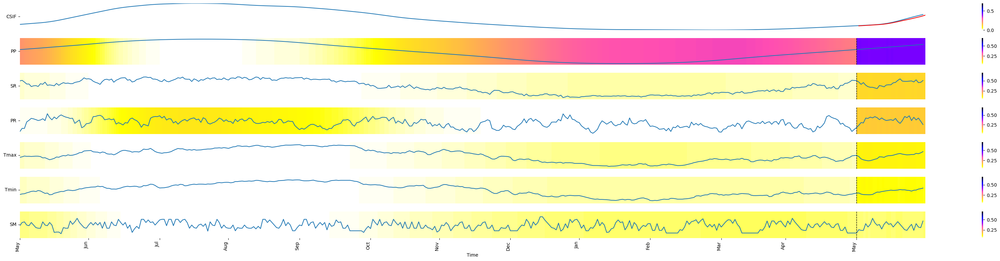

median 46.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_473568/4242511372.py:443: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


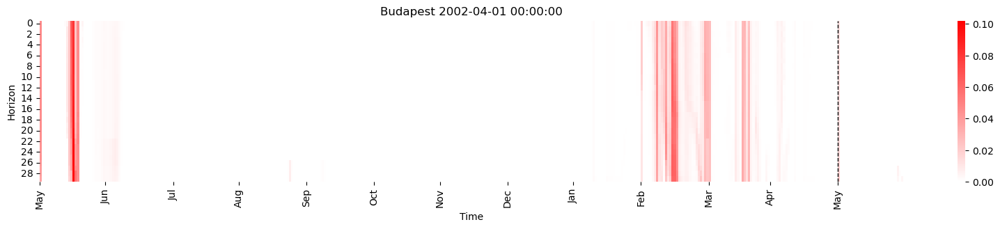

In [42]:
main_feature_map("Budapest", "BDT", "sos")

max 50.0
min 42.5
median 47.0
mean 47.0
median 46.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[ 3216 22764 26022 29280 37207 39995 40465 42312 42783 45570 50239 53027
 55344 55815 60013 62331 69317 71634 75833 78150 82819 85137]


/local/ipykernel_473568/806423281.py:327: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


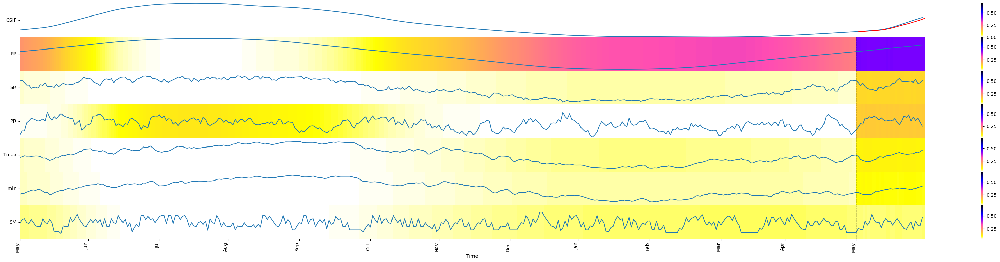

median 46.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_473568/806423281.py:443: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


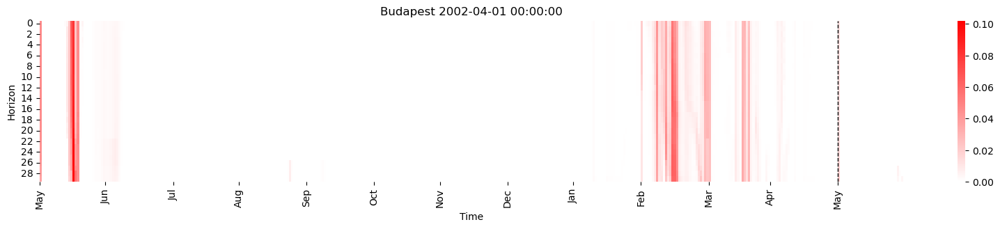

In [38]:
main_feature_map("Budapest", "BDT", "sos")

In [9]:
pip install proplot

Defaulting to user installation because normal site-packages is not writeable
DEPRECATION: Loading egg at /burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/singularity_hpc-0.1.28-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.9/37.9 MB 45.2 MB/s eta 0:00:00m eta 0:00:010:00:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 47.0 MB/s eta 0:00:00m eta 0:00:010:00:01
  Created wheel for matplotlib: filename=matplotlib-3.4.3-cp311-cp311-linux_x86_64.whl size=7104372 sha256=1d93f6c834bc818b891a253e0e5c52f11dcb04c4bbdadc1dd961a7733d8b179b
  Stored in directory: /burg/home/al4385/.cache/pip/wheels/5a/99/fa/d6b0fc4a7c0f444b5f0ee8e7513f1d3095338bc1b458033e5d
Successfully built matplotlib
ERROR: pip's dependency resolver does not currently 

max 63.0
min 50.0
median 57.5
mean 57.5
median 58.25
window: 2002-06-03 00:00:00 , 2002-06-06 00:00:00
[ 50536  53324  56112  59370  69614  73342  96148 104512 108710]


/local/ipykernel_473568/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


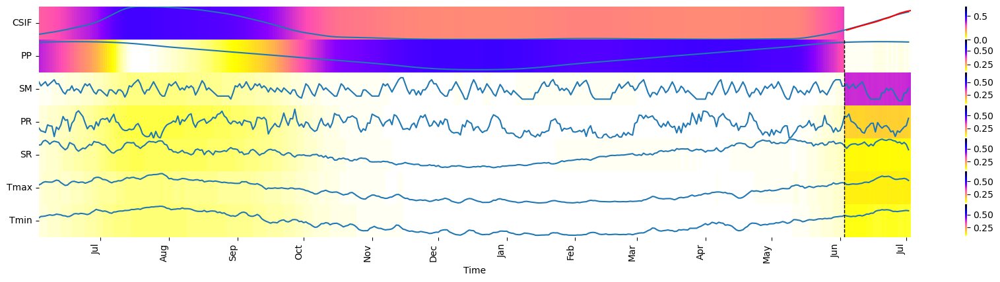

median 58.25
window: 2002-06-03 00:00:00 , 2002-06-06 00:00:00


/local/ipykernel_473568/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


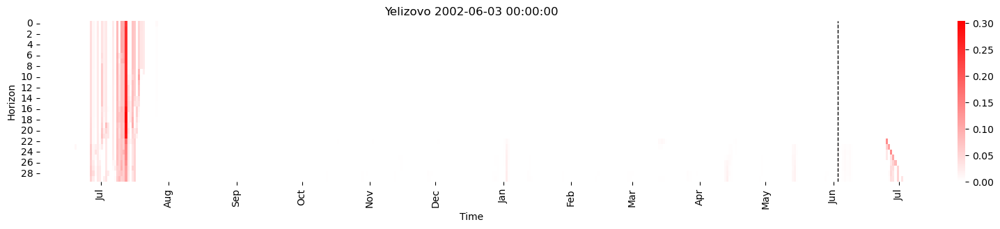

In [6]:
main_feature_map("Yelizovo", "BDT", "sos")

max 63.0
min 50.0
median 57.5
mean 57.5
median 58.25
window: 2002-06-03 00:00:00 , 2002-06-06 00:00:00
[ 50536  53324  56112  59370  69614  73342  96148 104512 108710]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


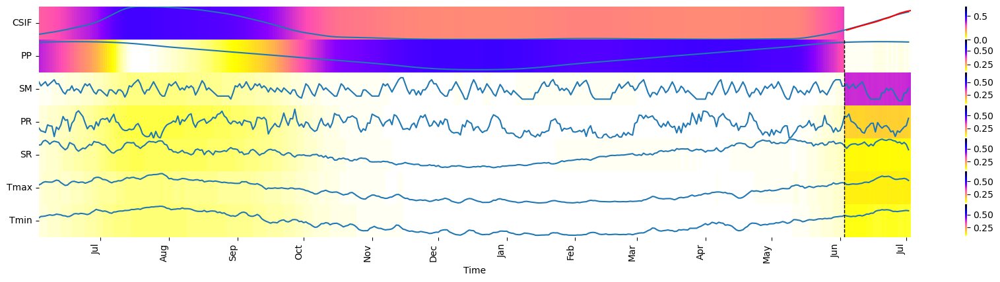

median 58.25
window: 2002-06-03 00:00:00 , 2002-06-06 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


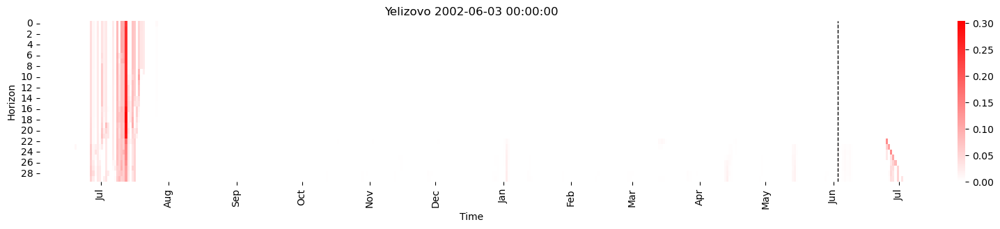

In [21]:
main_feature_map("Yelizovo", "BDT", "sos")

max 63.0
min 50.0
median 57.5
mean 57.5
window: 2002-09-15 00:00:00 , 2002-09-18 00:00:00
[ 50561  53349  56137  59395  69639  73367  96173 104537 108735]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


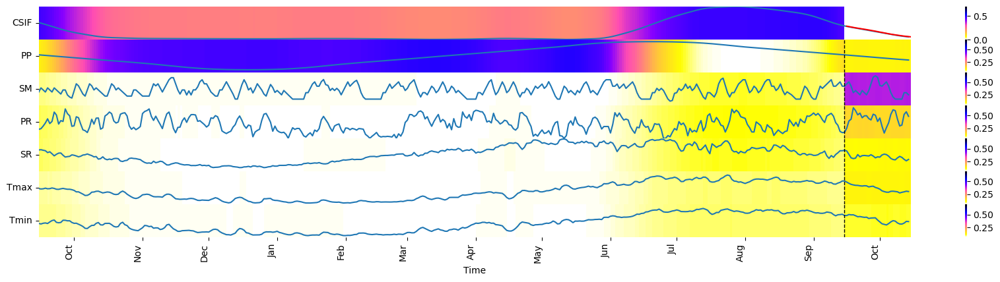

window: 2002-09-15 00:00:00 , 2002-09-18 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


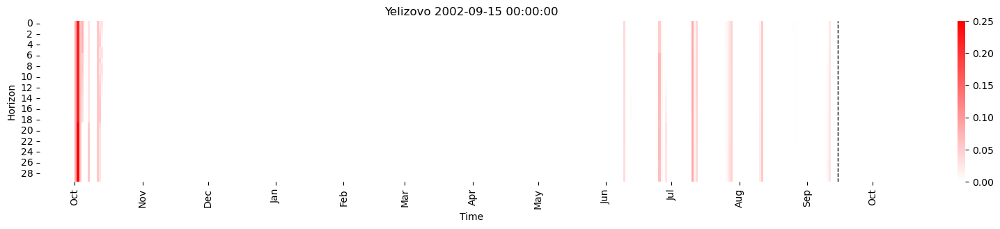

In [23]:
main_feature_map("Yelizovo", "BDT", "eos")

max 46.75
min 27.0
median 41.25
mean 41.25
window: 2002-10-01 00:00:00 , 2002-10-04 00:00:00
[ 45051  47369  47839  50157  57613  59931  64599  66447  66917  71115
  73433  77631  79949  80419  82737  86935  90663  92981  97179  99497
 109741 112999 116257 119045 121833 123243 126031 129289 138123 139533
 145579]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


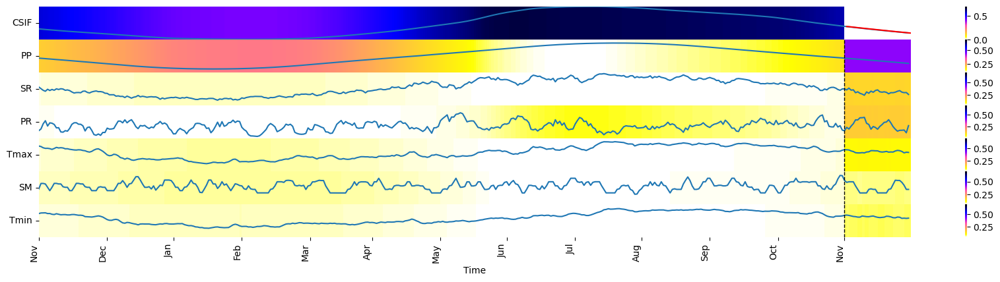

window: 2002-10-01 00:00:00 , 2002-10-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


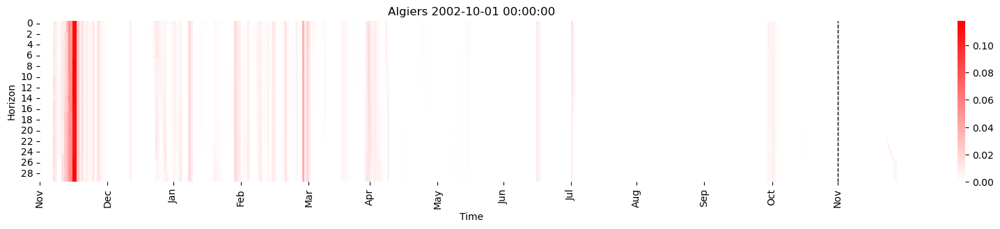

In [24]:
main_feature_map("Algiers", "BDT", "eos")

50_20
max 46.75
min 27.0
median 41.25
mean 41.25
median 42.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[ 50239  52557  53027  55344  60013  61860  62331  66529  68847  69317
  73045  75363  75833  78150  82819  84666  85137  88865  94911 101897
 104214 107943 114459 117717 120504 121915 124703]


/local/ipykernel_1374261/145309082.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


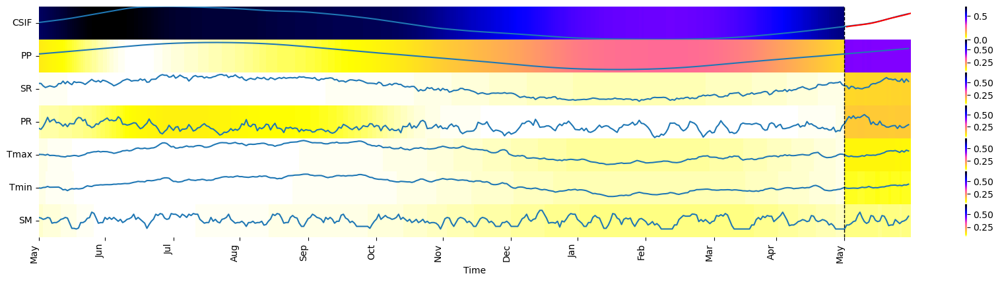

median 42.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1374261/145309082.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


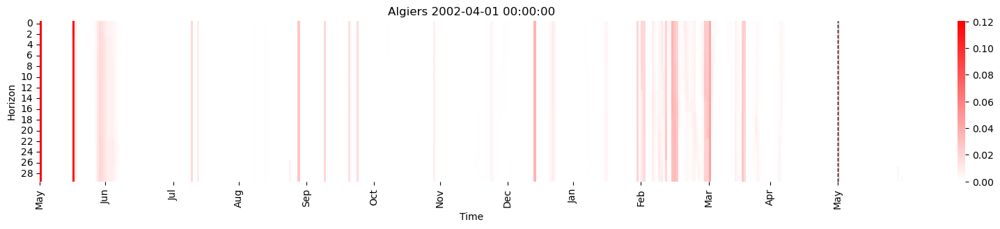

In [17]:
main_feature_map("Algiers")

50_20
max 42.0
min 22.25
median 38.0
mean 38.0
median 40.5
window: 2002-04-03 00:00:00 , 2002-04-06 00:00:00
[ 89335  93063  93533  95381  99579 100049 102367 106565 108413 111671
 113081 116339 119127 121915 127961 138205]


/local/ipykernel_1374261/145309082.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


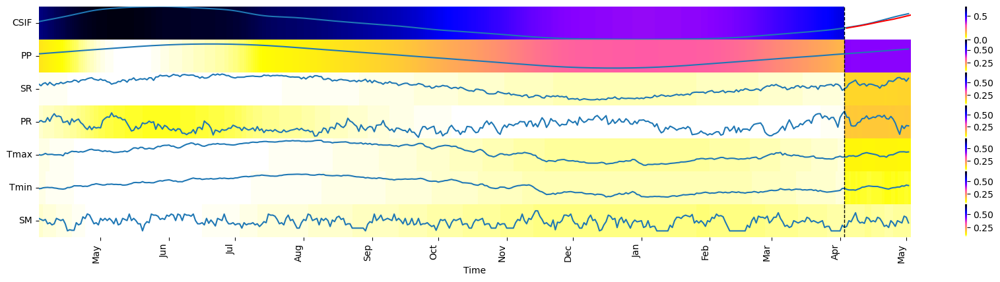

median 40.5
window: 2002-04-03 00:00:00 , 2002-04-06 00:00:00


/local/ipykernel_1374261/145309082.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


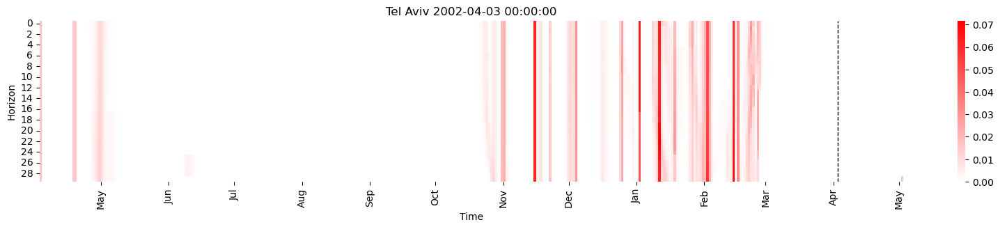

In [18]:
main_feature_map("Tel Aviv")

50_20
max 45.0
min 25.25
median 40.25
mean 40.25
median 38.25
window: 2002-02-15 00:00:00 , 2002-02-18 00:00:00
[ 61192  63510  74694  83998  90044  94242 103076 107274 109122 110532
 112380 113790 117048 119836 122624 125412 128670 131928 136126 138914
 141702 146370 148218]


/local/ipykernel_1374261/145309082.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


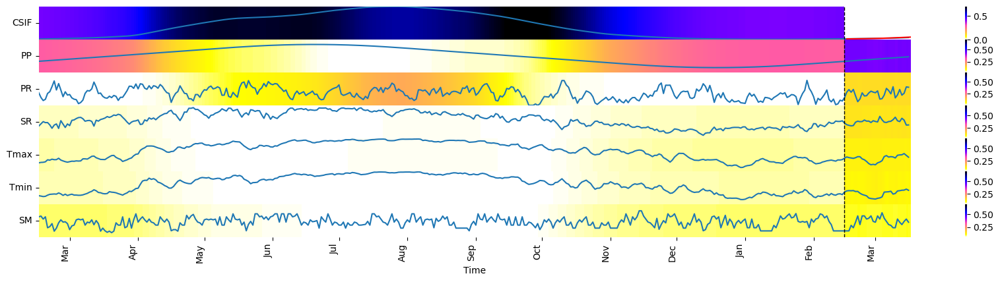

median 38.25
window: 2002-02-15 00:00:00 , 2002-02-18 00:00:00


/local/ipykernel_1374261/145309082.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


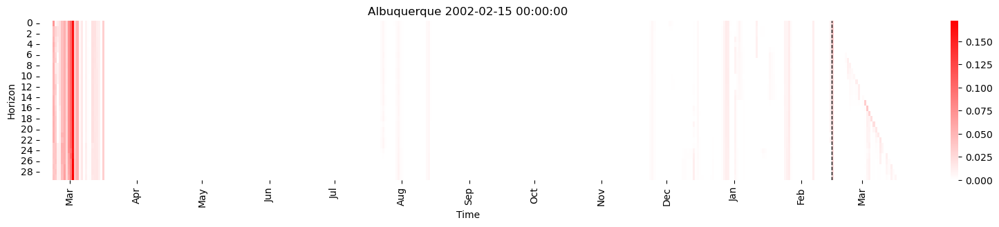

In [19]:
main_feature_map("Albuquerque")

50_20
max 35.5
min 20.0
median 34.25
mean 34.25
median 34.25
window: 2002-03-10 00:00:00 , 2002-03-13 00:00:00
[132967 133437 136225 137636 139483 140424 140894 143211 144152 146469
 147410]


/local/ipykernel_1389433/398685807.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


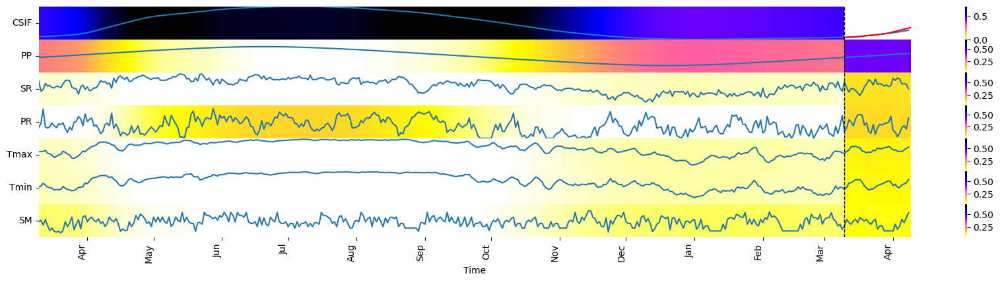

median 34.25
window: 2002-03-10 00:00:00 , 2002-03-13 00:00:00


/local/ipykernel_1389433/398685807.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


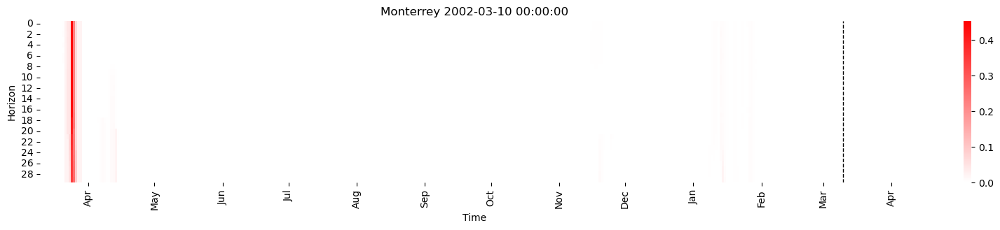

In [3]:
main_feature_map("Monterrey")

50_20
max 46.0
min 26.25
median 40.75
mean 40.75
median 38.25
window: 2003-02-19 00:00:00 , 2003-02-22 00:00:00
[ 74563 107143 110401 113659 119705 121116 123904 135995 137406 143922
 146239]


/local/ipykernel_1389433/398685807.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


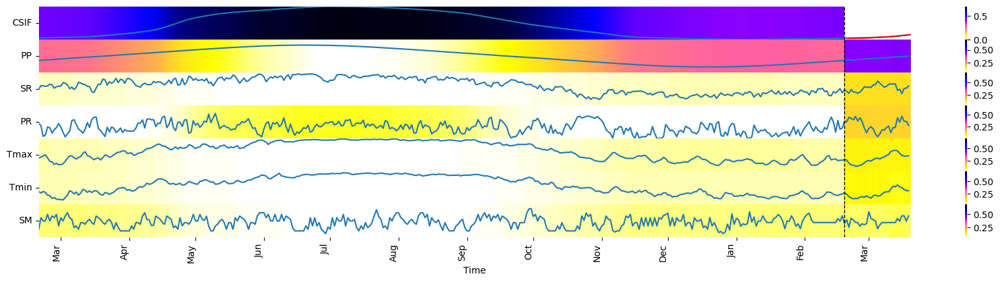

median 38.25
window: 2003-02-19 00:00:00 , 2003-02-22 00:00:00


/local/ipykernel_1389433/398685807.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


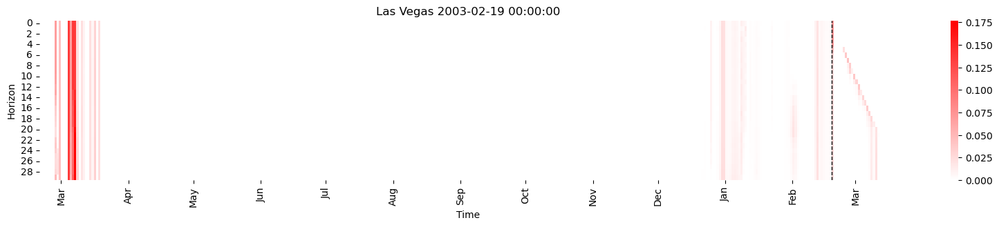

In [4]:
main_feature_map("Las Vegas")

max 70.5
min 50.75
median 58.25
mean 58.25
median 58.5
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00
[ 12817  13758  16546  32365  39822  48185  77507  81235  84964  88692
 100783 104982 113345 117544 126847 131046 139409 143608]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


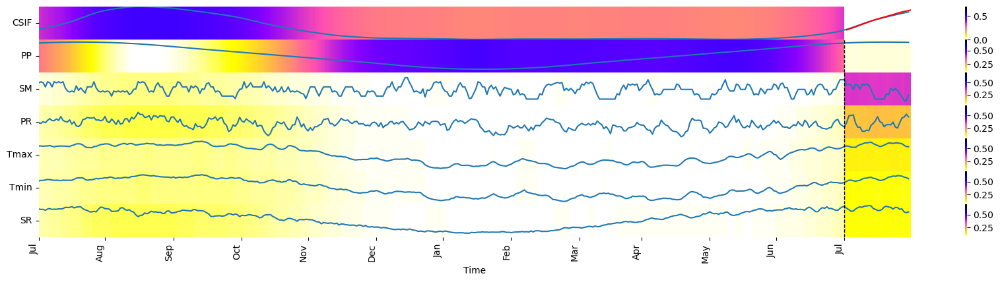

median 58.5
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


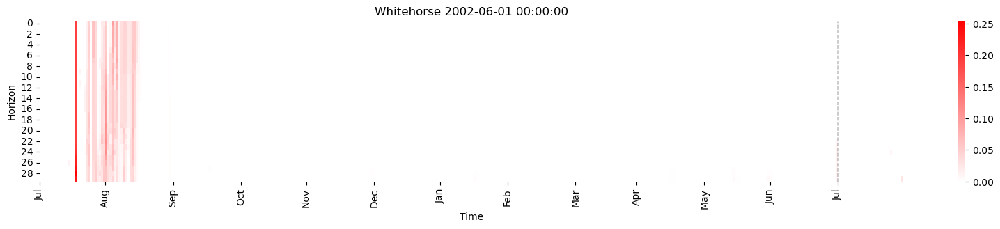

In [25]:
main_feature_map("Whitehorse", "BDT", "sos")

50_20
max 50.0
min 37.75
median 45.25
mean 45.25
median 47.75
window: 2002-04-21 00:00:00 , 2002-04-24 00:00:00
[    58    528   7044  10302  20546  23804  27062  46140 105254 110359
 113617]


/local/ipykernel_1389433/398685807.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


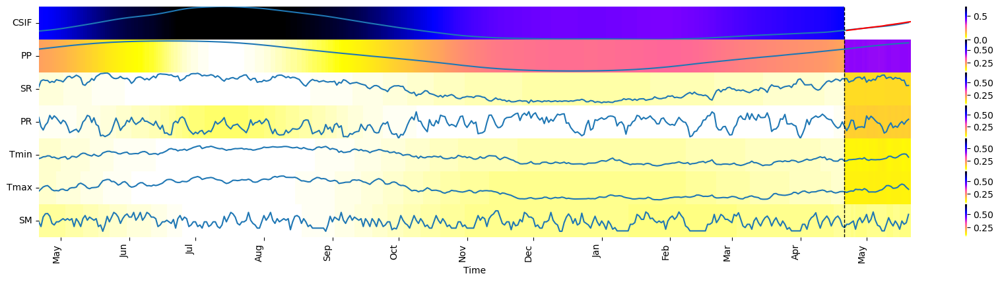

median 47.75
window: 2002-04-21 00:00:00 , 2002-04-24 00:00:00


/local/ipykernel_1389433/398685807.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


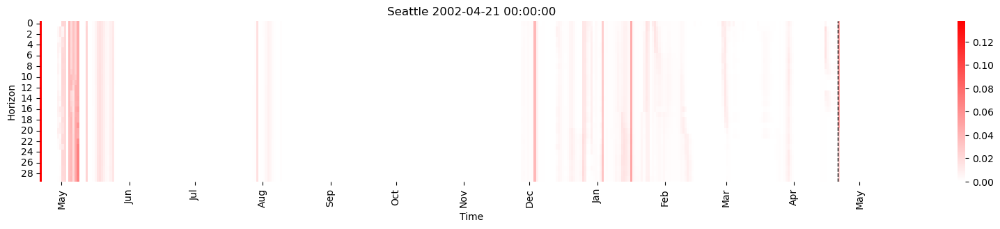

50_20
max 50.0
min 35.75
median 44.5
mean 44.5
median 44.0
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  1369   7415  11143  14401  17659  20917  24175  27433  30691  33479
  33949  36267  36737  39054  39525  46511  46981  49299  49769  52086
  56755  59073  59543  66059  68376  72575  74892  79561  81879  82349
  88395  92123  92593  94440  99109 101427 105625 107472 110730 111201
 113988 115399 117246 118657 121445 124233 127020 127491 130278 130749]


/local/ipykernel_1389433/398685807.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


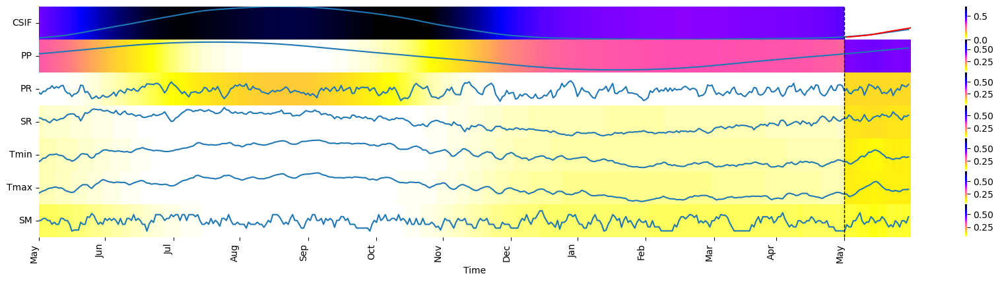

median 44.0
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1389433/398685807.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


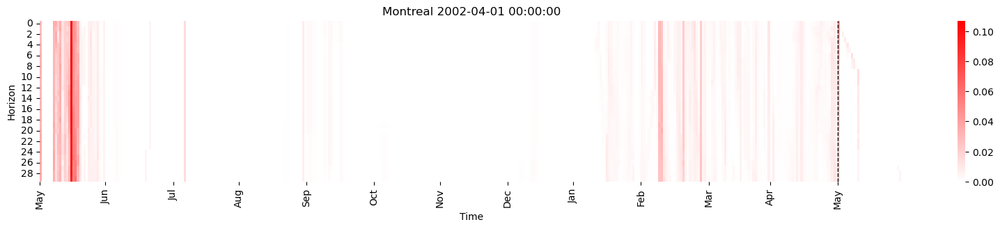

In [6]:
main_feature_map("Seattle")
main_feature_map("Montreal")

-20_-60
max -28.75
min -48.5
median -32.75
mean -32.75
median -35.25
window: 2002-09-15 00:00:00 , 2002-09-18 00:00:00
[37529 39847 43575 46833 55667 57077 59395 59865 60335 62653 63123 63593]


/local/ipykernel_1389433/398685807.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


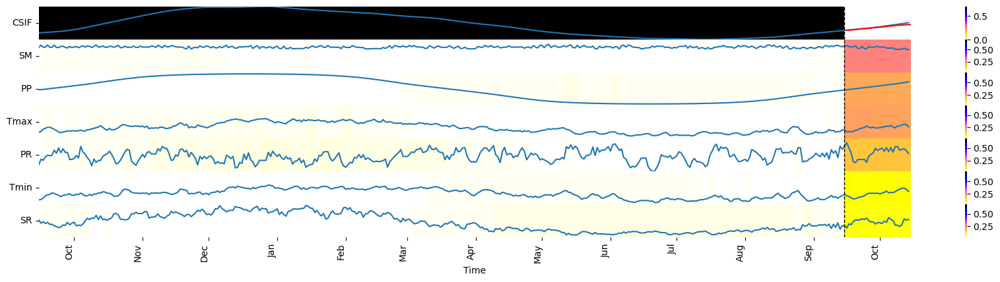

median -35.25
window: 2002-09-15 00:00:00 , 2002-09-18 00:00:00


/local/ipykernel_1389433/398685807.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


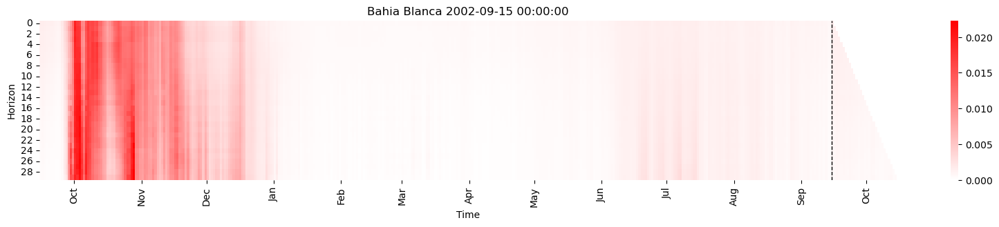

In [9]:
# main_feature_map('Havana')
# main_feature_map('Quito')
main_feature_map("Bahia Blanca")

max -0.5
min -20.25
median -5.0
mean -5.0
median -6.75
window: 2002-08-01 00:00:00 , 2002-08-04 00:00:00
[ 68030  68501  70348  74076  74546  76864  78275  80592  81062  84791
  86638  87108  91307  93154  93624  97352  97823  99670 101081 102928
 104339 106186 107597 109444 110384 112702 113172 114113 116430 116900
 119218 120158 122476 123416 125734 126204 127145 129462 129932 130403
 132250 132720 133190 133661 135508 135978 136448 136919 138766 139236]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


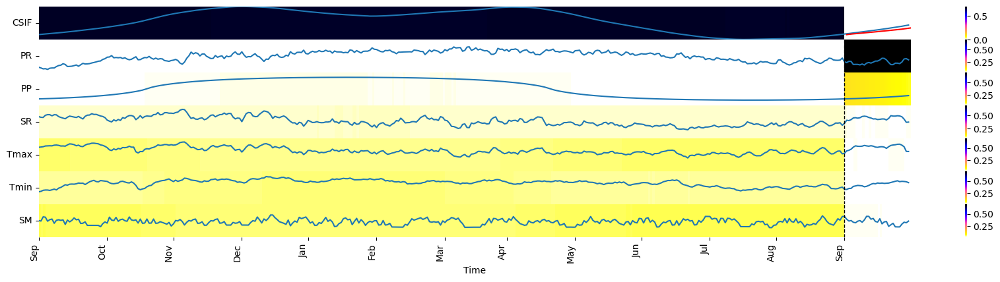

median -6.75
window: 2002-08-01 00:00:00 , 2002-08-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


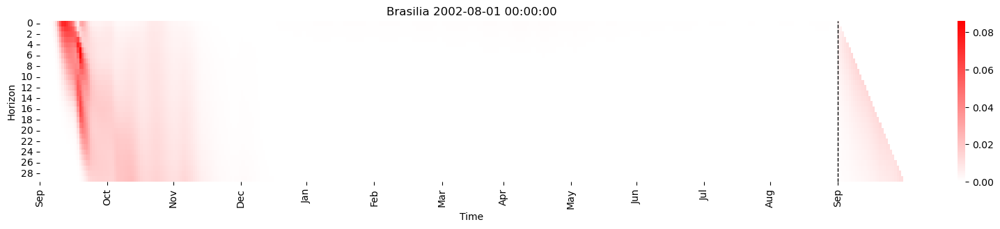

In [26]:
main_feature_map("Brasilia", "BET", "sos")

-20_20
max 19.5
min -0.25
median 9.5
mean 9.5
median 10.25
window: 2002-01-15 00:00:00 , 2002-01-18 00:00:00
[23812 24282 26600 27070 29858 30328 33586 34056 35904 39632 40102 43830
 45678 49406 49876 53604 55452 59180 62438 65696]


/local/ipykernel_1393466/398685807.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


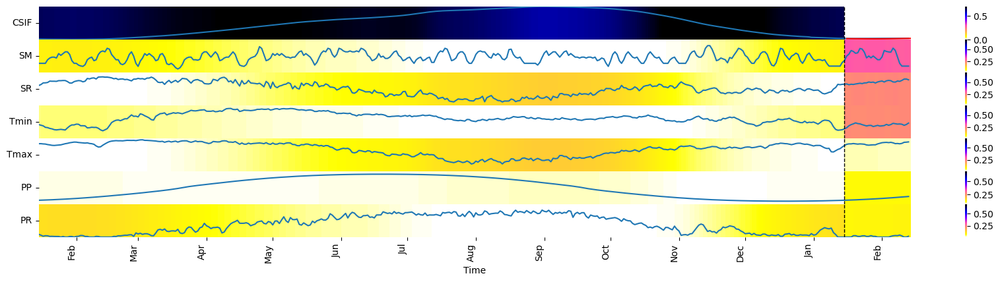

median 10.25
window: 2002-01-15 00:00:00 , 2002-01-18 00:00:00


/local/ipykernel_1393466/398685807.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


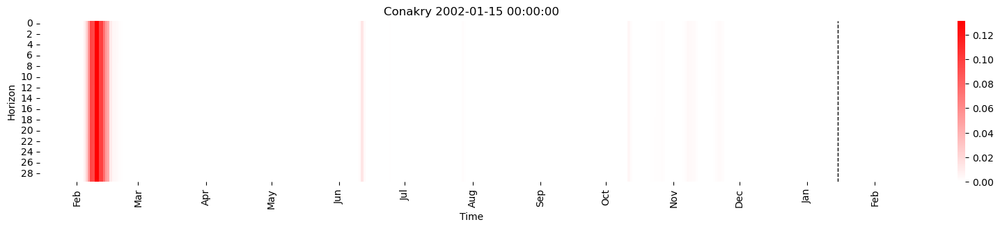

In [4]:
main_feature_map("Conakry")

-20_20
max 16.0
min -3.75
median 8.25
mean 8.25
median 6.0
window: 2002-03-12 00:00:00 , 2002-03-15 00:00:00
[23606 33380 39426 47352 62232 75734 76674 85038 85508 85978 88296]


/local/ipykernel_1397271/3350367633.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


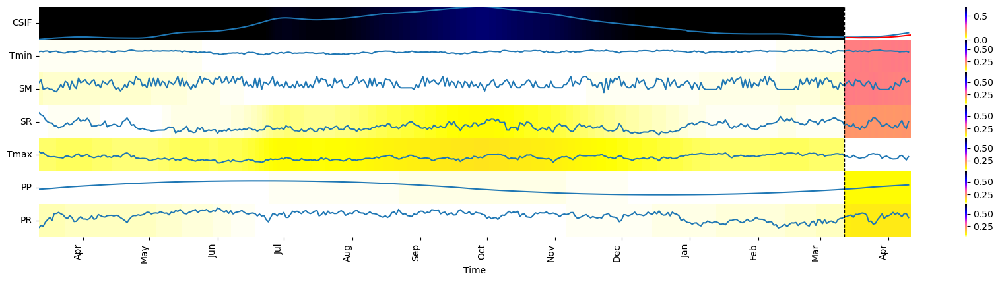

median 6.0
window: 2002-03-12 00:00:00 , 2002-03-15 00:00:00


/local/ipykernel_1397271/3350367633.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


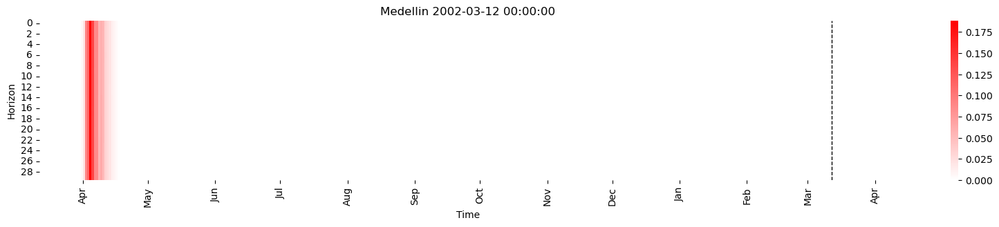

In [3]:
main_feature_map("Medellin")

-20_20
max -5.5
min -20.0
median -9.25
mean -9.25
median -9.25
window: 2002-08-01 00:00:00 , 2002-08-04 00:00:00
[103398 103868 106186 106656 107597 109444 110855 112702 113642 114113
 116900 117371 120158 122946 123416 125734 126204 127145 128992 129932
 130403 132720 133190 135508 135978 136919 138766 140177 142964 143435
 146222]


/local/ipykernel_1397271/3350367633.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


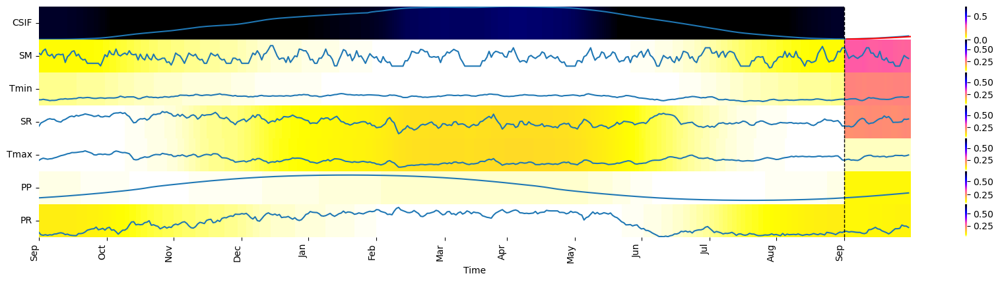

median -9.25
window: 2002-08-01 00:00:00 , 2002-08-04 00:00:00


/local/ipykernel_1397271/3350367633.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


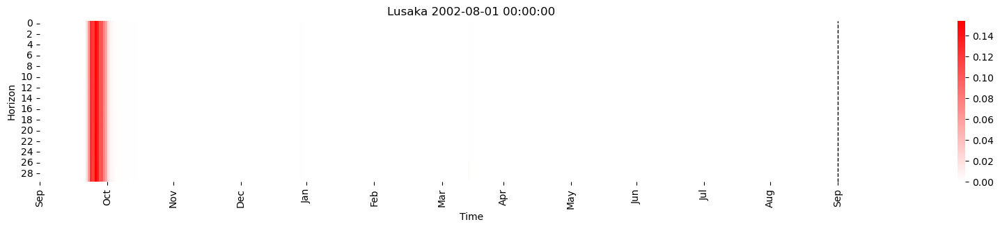

In [4]:
main_feature_map("Lusaka")

-20_-60
max -24.0
min -43.75
median -30.0
mean -30.0
median -28.0
window: 2002-08-25 00:00:00 , 2002-08-28 00:00:00
[20200 21140 36020 36960 39278 40688 43006 46264 49522 52780 53720]


/local/ipykernel_1397271/3350367633.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


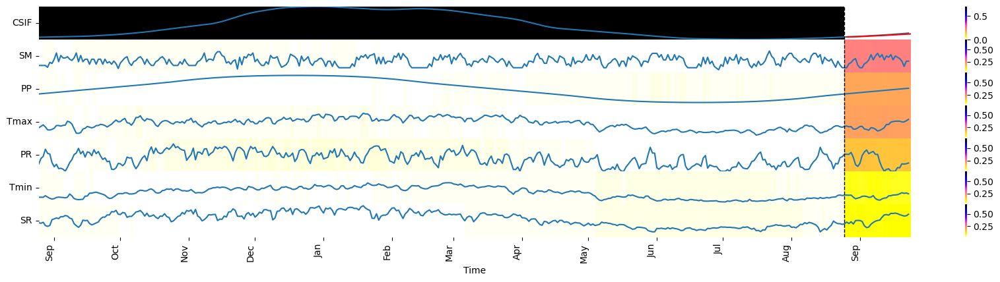

median -28.0
window: 2002-08-25 00:00:00 , 2002-08-28 00:00:00


/local/ipykernel_1397271/3350367633.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


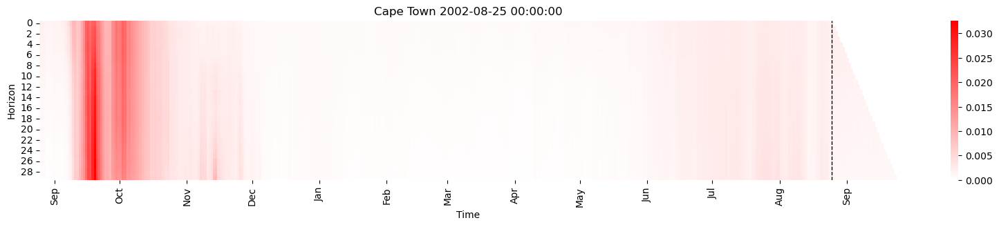

In [5]:
main_feature_map("Cape Town")

-20_20
max 8.5
min -11.25
median -3.5
mean -3.5
median -2.75
window: 2002-08-01 00:00:00 , 2002-08-04 00:00:00
[ 54528  58256  58727  61514  61985  63832  64772  65243  68030  68501
  70818  71759  74076  74546  75017  77334  77804  80122  80592  81062
  81533  84791  87578  88049  89896  91307  93624  94565  96412  97352
  97823 100140 101081 103398 103868 106186 106656 109444 110855 112702
 113642 114113 116900 117371 120158 122946 123416 126204 127145 128992
 129932 130403 132720 133190 135978]


/local/ipykernel_1397271/3350367633.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


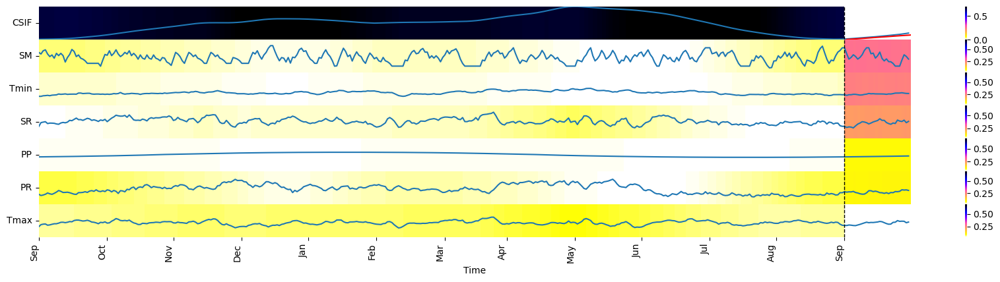

median -2.75
window: 2002-08-01 00:00:00 , 2002-08-04 00:00:00


/local/ipykernel_1397271/3350367633.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


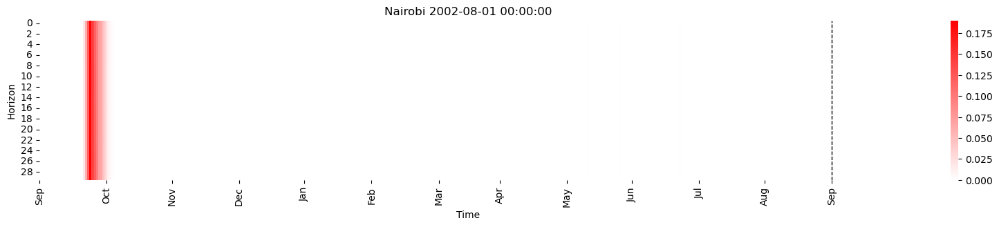

In [6]:
main_feature_map("Nairobi")

-20_20
max 20.0
min 3.25
median 10.0
mean 10.0
median 18.0
window: 2002-03-01 00:00:00 , 2002-03-04 00:00:00
[ 3084  4932  5872  8190  9600 11448 12858 15176 17964 18904 35194 47286]


/local/ipykernel_1397271/3350367633.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


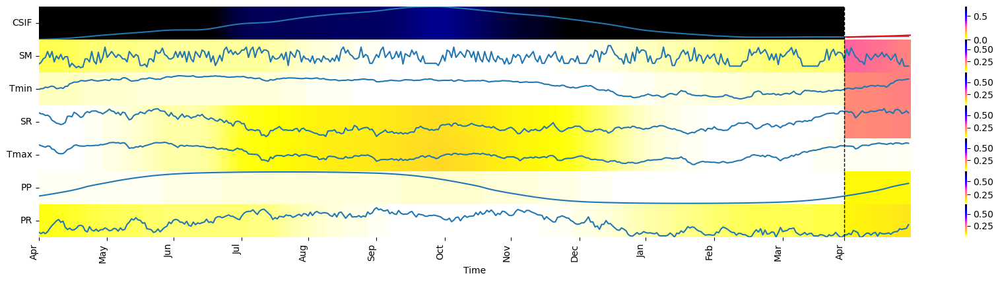

median 18.0
window: 2002-03-01 00:00:00 , 2002-03-04 00:00:00


/local/ipykernel_1397271/3350367633.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


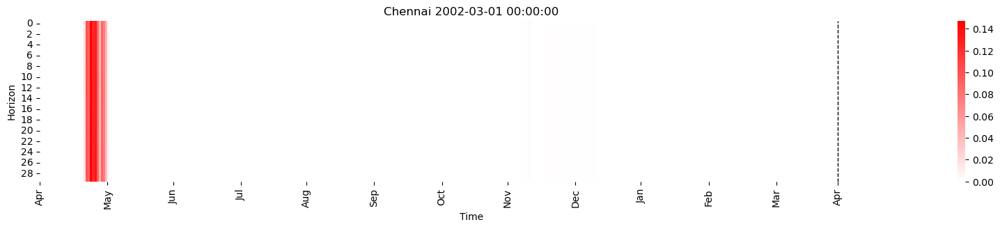

In [7]:
main_feature_map("Chennai")

In [9]:
main_feature_map("Patna")

50_20
max 35.5
min 20.0
median 34.25
mean 34.25
median 33.75


TypeError: cannot unpack non-iterable NoneType object

In [4]:
main_feature_map("Bangkok")

-20_20
max 2.75
min -17.0
median -7.5
mean -7.5
median -12.75


TypeError: cannot unpack non-iterable NoneType object

In [5]:
main_feature_map("Hanoi")

50_20
max 31.0
min 20.0
median 25.0
mean 25.0
median 25.5


TypeError: cannot unpack non-iterable NoneType object

In [3]:
main_feature_map("Shenzhen")

50_20
max 32.5
min 20.0
median 32.5
mean 32.5
median 26.75


TypeError: cannot unpack non-iterable NoneType object

50_20
max 50.0
min 30.25
median 43.75
mean 43.75
median 42.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  6474   9732  12990  13461  16248  16719  19977  23235  26493  29751
  32538  35796  43253  56285  69787  72105  76303  81408  91653  95851
  98169 114929 131219 134007 137265 140052 141463 143781 144721 147039
 147979]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


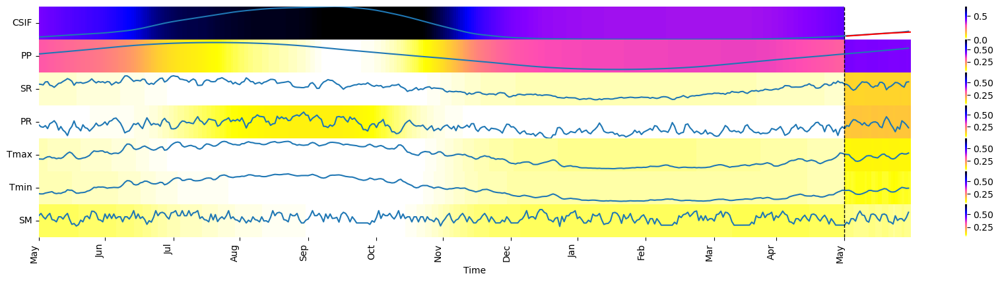

median 42.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


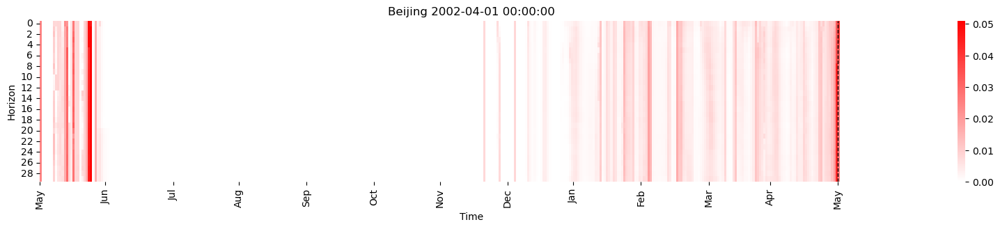

In [3]:
main_feature_map("Beijing")

50_20
max 50.0
min 36.0
median 44.5
mean 44.5
median 44.25
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  6474   9732  10203  12990  13461  16719  19977  23235  23705  26493
  26963  29751  32538  35796  43253  46041  56285  58602  63271  69787
  72105  76303  79091  81408  91653  95851  98169 105155 114929 123762
 125173 128431 131219]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


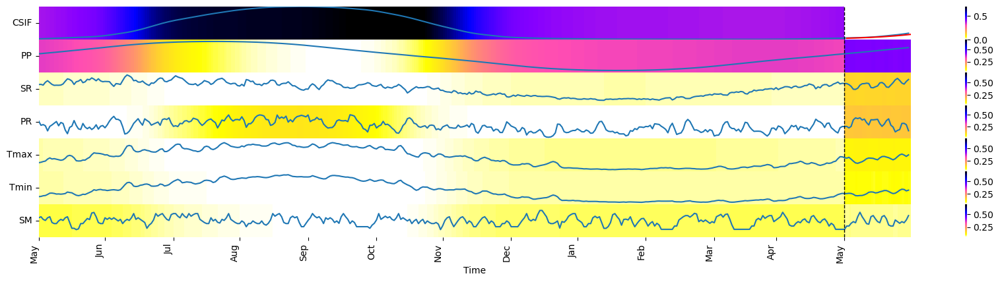

median 44.25
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


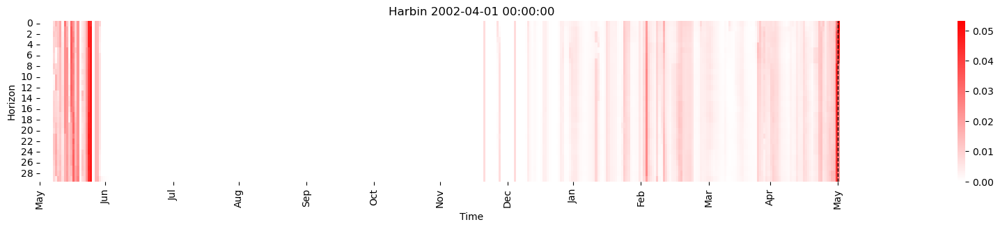

In [4]:
main_feature_map("Harbin")

50_20
max 49.0
min 29.25
median 42.75
mean 42.75
median 41.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[ 19977  23235  23705  26493  26963  29751  32538  35796  43253  46041
  56285  58602  63271  69787  72105  76303  79091  81408  91653  95851
  98169 105155 114929 123762 125173 128431 131219 134007 137265 140052
 141463 143781 144721 147039 147979]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


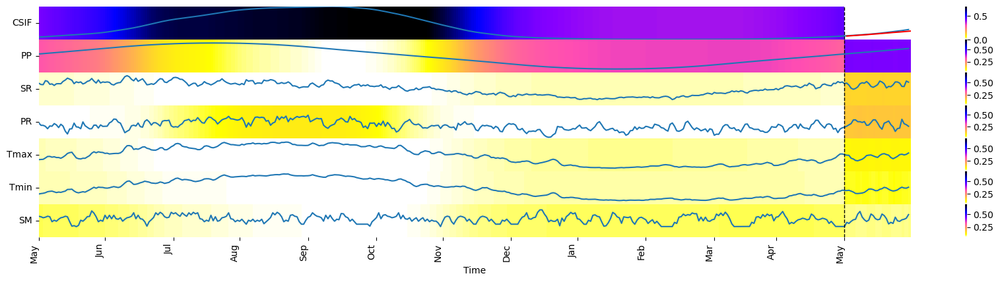

median 41.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


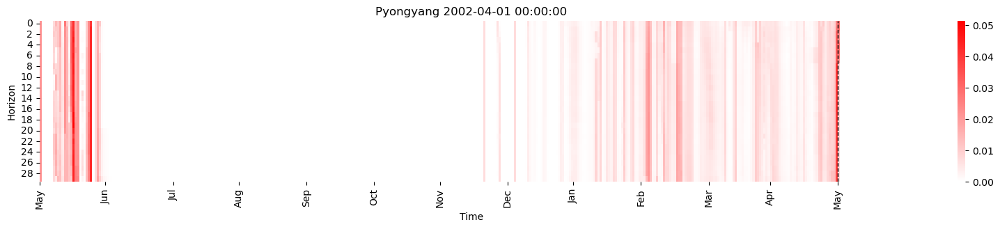

In [7]:
main_feature_map("Pyongyang")

50_20
max 45.5
min 25.75
median 40.5
mean 40.5
median 40.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[ 58602  63271  69787  72105  76303  79091  81408 105155 123762 125173
 128431 137265 141463 143781]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


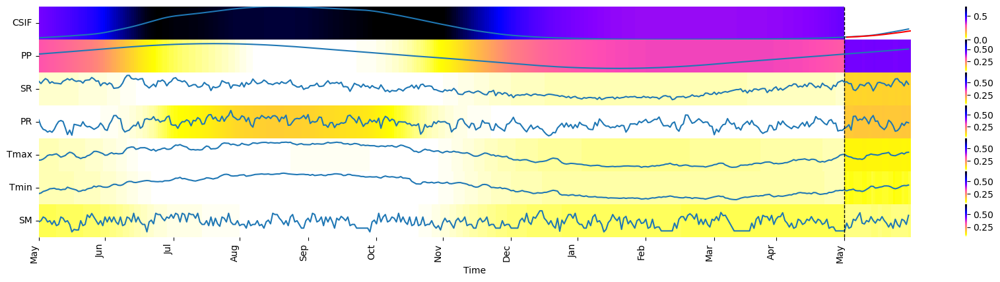

median 40.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


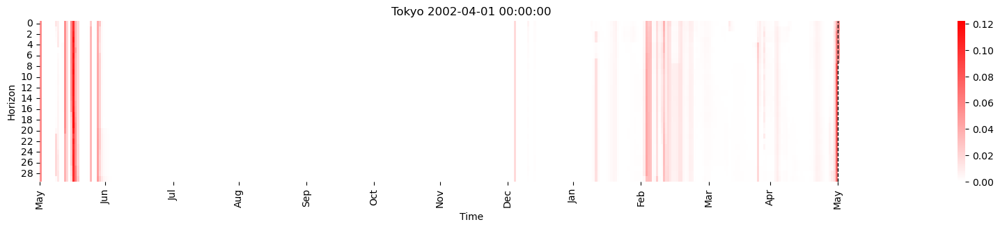

In [6]:
main_feature_map("Tokyo")

max 63.0
min 50.0
median 57.5
mean 57.5
median 58.25
window: 2002-06-03 00:00:00 , 2002-06-06 00:00:00
[ 50536  53324  56112  59370  69614  73342  96148 104512 108710]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


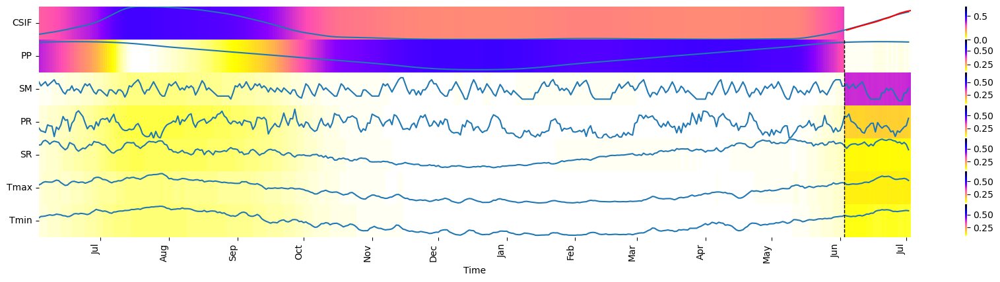

median 58.25
window: 2002-06-03 00:00:00 , 2002-06-06 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


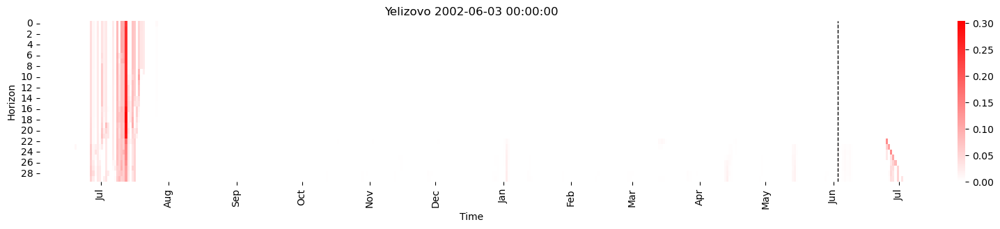

In [31]:
main_feature_map("Yelizovo", "BDT", "sos")

max 66.0
min 50.0
median 58.0
mean 58.0
median 57.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00
[ 12347  16075  18863  20274  25379  36564  42139  44927  52854  55642
  58900  62158  65416  68674  69144  72402  84023  87281  87751  91009
  91480  91950  95208 103571 104041 107299 107770 108240 111498 116603
 120802 121272 129635 130105 133834 134304 146395]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


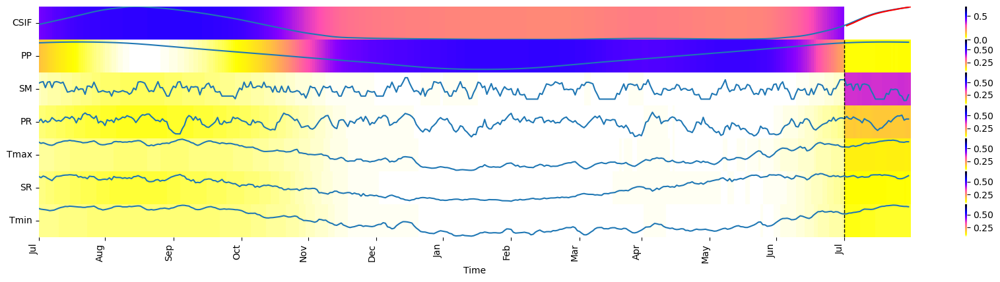

median 57.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


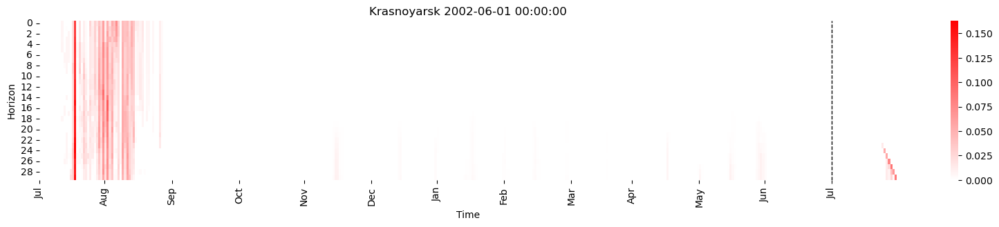

In [29]:
main_feature_map("Krasnoyarsk", "BDT", "sos")  # center russia

max 64.75
min 50.0
median 58.0
mean 58.0
median 57.75
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00
[ 13288  16075  20274  23532  25379  29107  36094  38881  41669  49596
  52384  55171  55642  58429  58900  61687  62158  64945  65416  68203
  68674  71932  72402  75660  87281  90539  91009  91480  94267  94738
  95208  98466 103571 106829 107299 107770 111028 111498 119861 120331
 120802 124060 124530 129635 133363 133834 137562 145925 146395]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


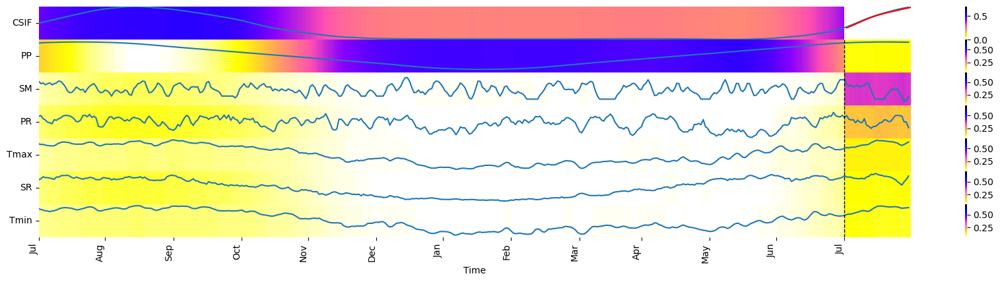

median 57.75
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


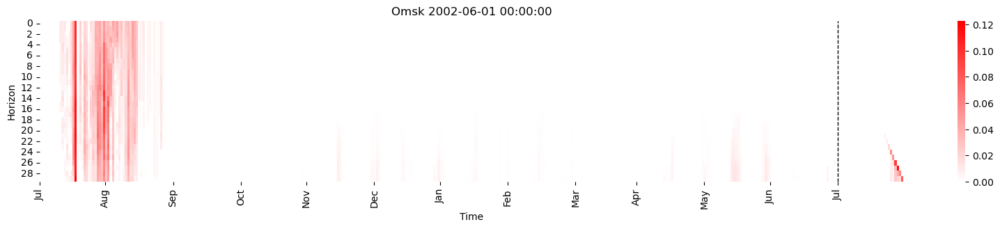

In [30]:
main_feature_map("Omsk", "BDT", "sos")

50_20
max 50.0
min 30.25
median 43.75
mean 43.75
median 44.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  3216   3687  19506  22764  26022  29280  39995  40465  42783  45570
  53027  55815  60013  62331  62801  65118  69317  71634  75833  78150
  85137  85607  89335  91182  95381  97698 102367 104214 104685 108413
 111671 117717 120504 121915 138205 143310]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


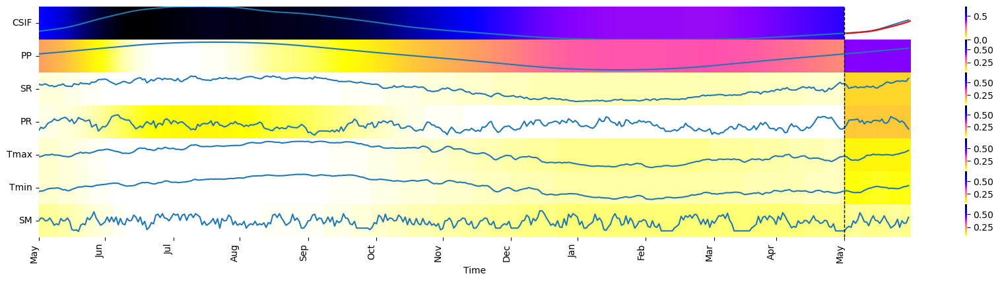

median 44.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


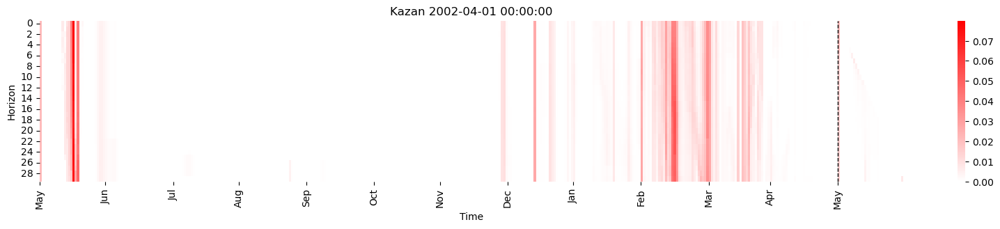

In [10]:
main_feature_map("Kazan")

max 50.0
min 30.25
median 43.75
mean 43.75
window: 2002-10-01 00:00:00 , 2002-10-04 00:00:00
[  2697   8273   8743   9213  12001  12471  15729  18987  22245  25503
  28761  32019  34807  35277  37595  38065  40383  47839  50627  53415
  58083  60401  64599  66917  67387  69705  73433  73903  80889  83207
  87405  89253  92981  93451  97179  99967 102285 106483 116257 119045]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


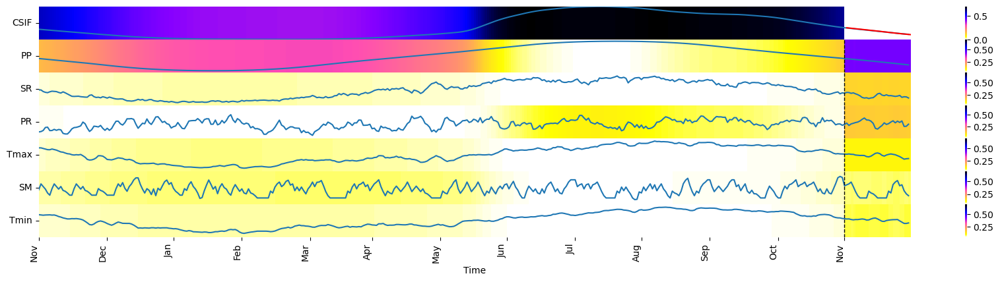

window: 2002-10-01 00:00:00 , 2002-10-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


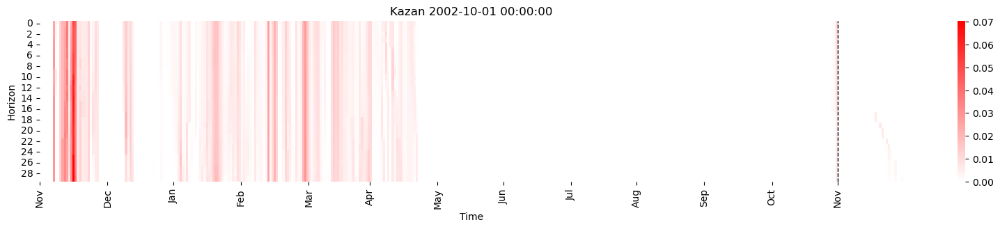

In [32]:
main_feature_map("Kazan", "BDT", "eos")

50_90
max 66.75
min 50.0
median 58.0
mean 58.0
median 58.25
window: 2002-04-15 00:00:00 , 2002-04-18 00:00:00
[  9799  14467  17255  20043  23301  27029  30757  33075  33545  35863
  43789  46577  47047  49365  49835  52153  55411  58669  61927  65185
  68443  71701  72171  74959  75429  75899  78687  79157  79627  82415
  82885  86143  94507  94977  97765  98235  98705 101963 102433 110797
 111267 114995 115465 120571 123829 124299 124769 128027 128497 133603
 137331 137801 141059 141529]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


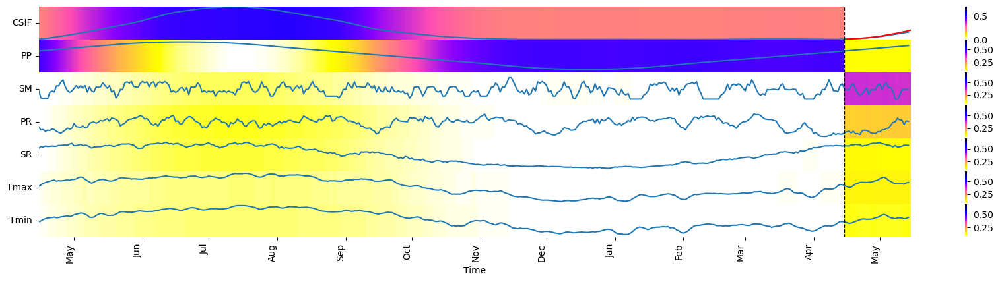

median 58.25
window: 2002-04-15 00:00:00 , 2002-04-18 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


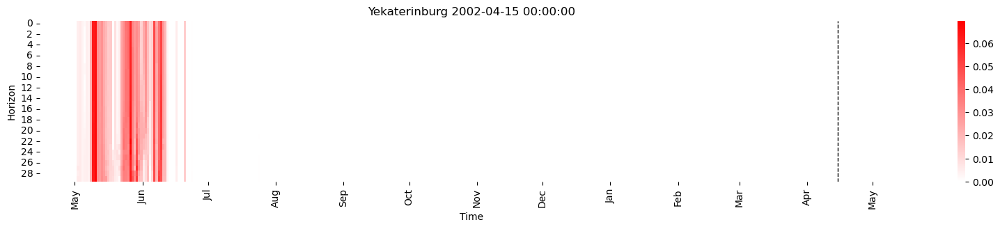

In [11]:
main_feature_map("Yekaterinburg")

max 70.75
min 54.75
median 58.75
mean 58.75
median 59.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00
[   256    726   2573   6301   9089  10500  13288  15605  17016  19804
  23062  26320  26790  28637  32836  33306  35153  35623  38411  46338
  49126  49596  51443  51913  54701  57959  61217  64475  67733  68203
  70991  71461  74249  74719  75190  77977  78448  78918  81706  82176
  85434  93797  94267  97525  97996 101724 110087 110557 114286 114756
 119861 123119 123589 124060 127788 132893]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


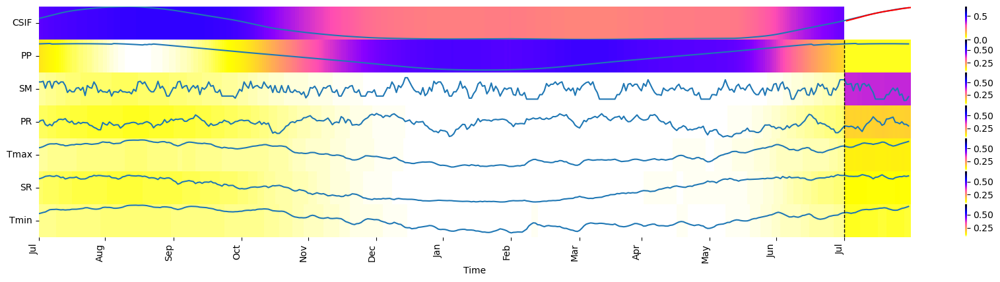

median 59.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


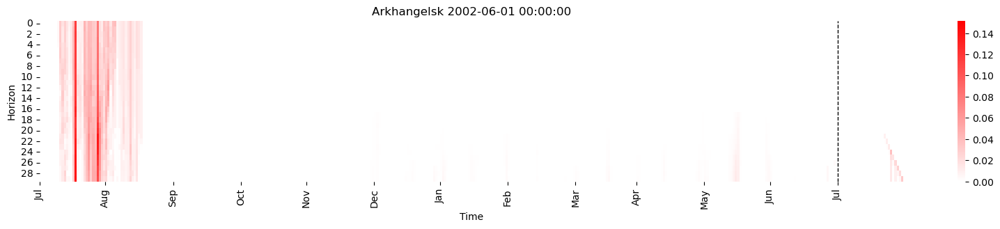

In [33]:
main_feature_map("Arkhangelsk", "BDT", "sos")

max 69.75
min 50.0
median 58.25
mean 58.25
median 60.75
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00
[  2573   3043   3514   3984   6301   6772   7242   9559  19333  22591
  26320  30048  43080  45868  48655  74249  77977  81706  85434  97055
 101254 114286 123119 127318 136151 140350]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


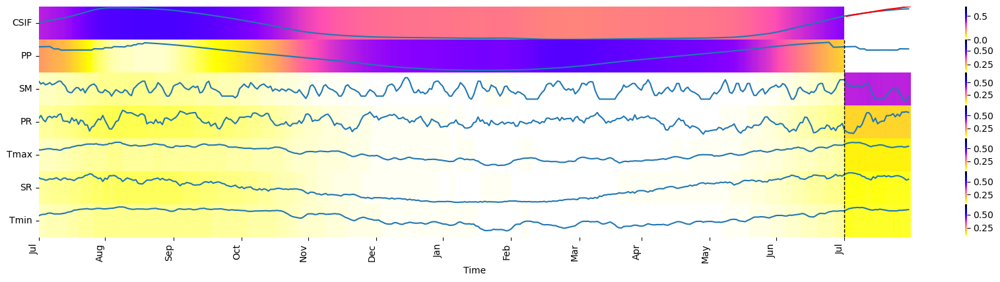

median 60.75
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


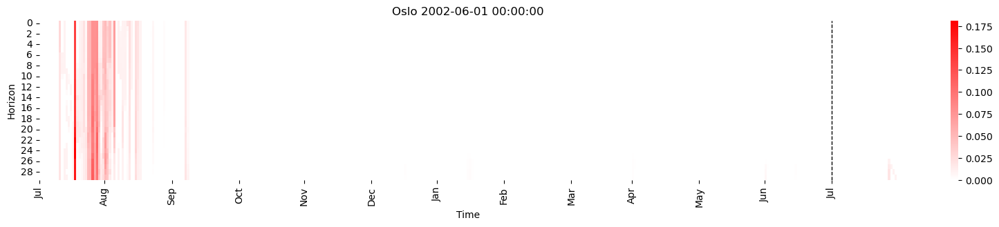

max 69.75
min 50.0
median 58.25
mean 58.25
window: 2002-09-01 00:00:00 , 2002-09-04 00:00:00
[  1155   1625   3473   3943   6731   7201  24431  26279  40251  43039
  45827  57011  60269  63527  81665  85393  89121 101213 105411 114245
 118913 127277 131945 140309 144507]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


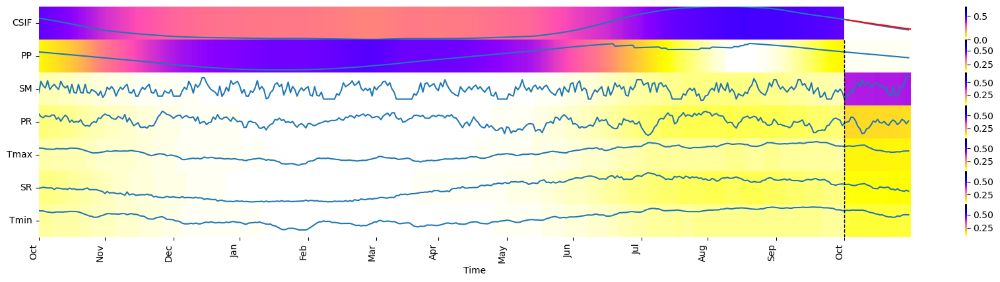

window: 2002-09-01 00:00:00 , 2002-09-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


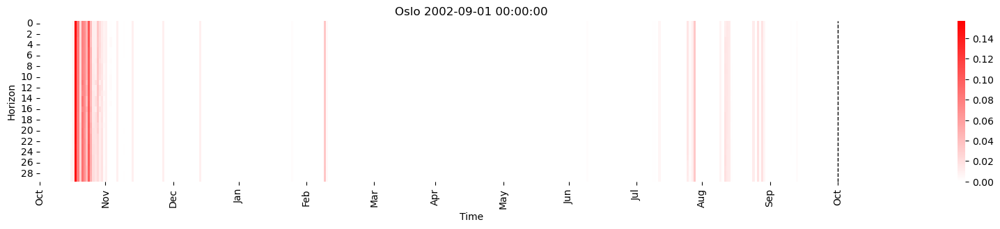

In [34]:
main_feature_map("Oslo", "BDT", "sos")
main_feature_map("Oslo", "BDT", "eos")

50_20
max 50.0
min 39.0
median 45.5
mean 45.5
median 45.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  7885  37207  39995  42312  50239  52557  53027  55344  60013  61860
  62331  66529  68847  69317  73045  75363  78150  82819  84666  85137
  88865  94911 101897 104214 107943]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


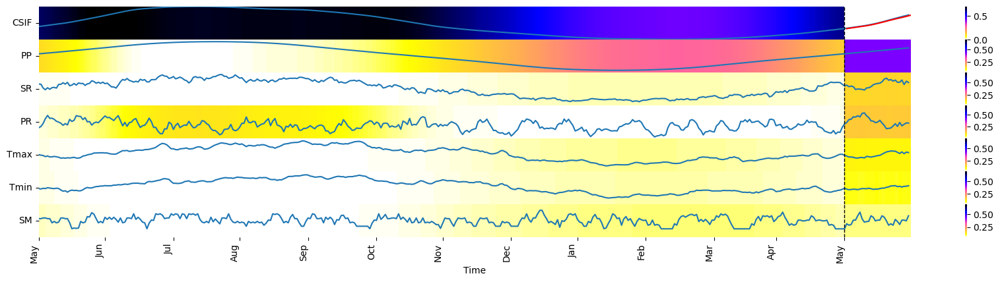

median 45.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


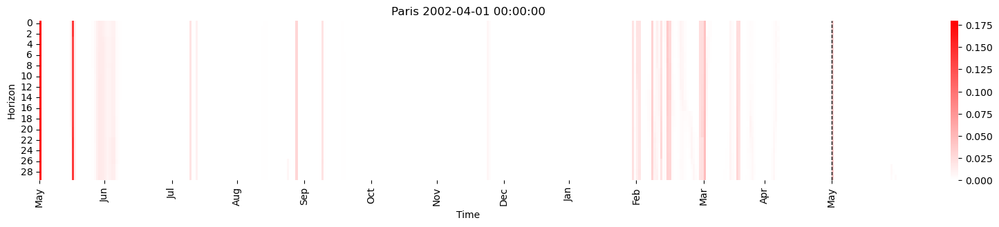

In [14]:
main_feature_map("Paris")

In [ ]:
main_feature_map("Brasilia")
main_feature_map("Las Vegas")
main_feature_map("Las Vegas")
main_feature_map("Las Vegas")

50_20
max 50.0
min 37.5
median 45.0
mean 45.0
median 45.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  3216   7885  19506  22764  26022  29280  37207  39995  40465  42312
  42783  45570  50239  52557  53027  55344  55815  60013  61860  62331
  62801  66529  68847  69317  71634  73045  75363  75833  78150  82819
  85137  88865  89335  91182  95381  97698 101897 102367 104214 111671
 117717 120504 121915]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


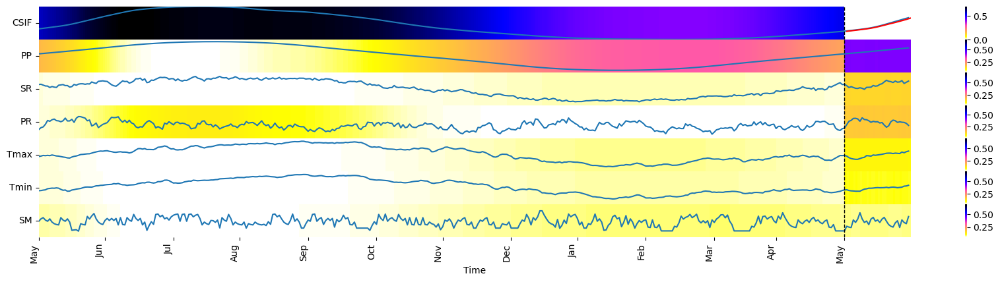

median 45.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


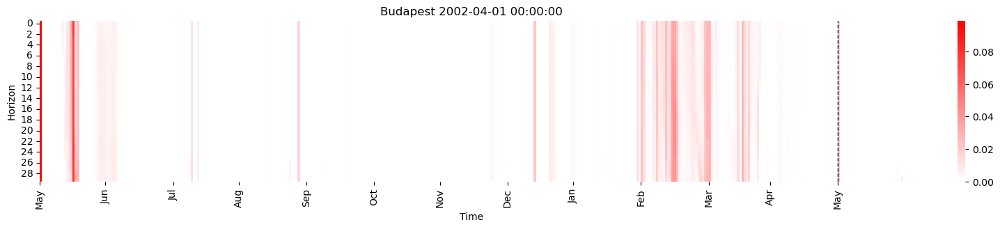

In [15]:
main_feature_map("Budapest")

50_20
max 50.0
min 31.75
median 43.75
mean 43.75
median 44.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  3216   3687   4157  19506  22764  26022  29280  40465  45570  53497
  55815  62801  65118  71634  85607  89335  91182  95381  97698 102367
 104685 108413 111671 127961 138205 143310]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


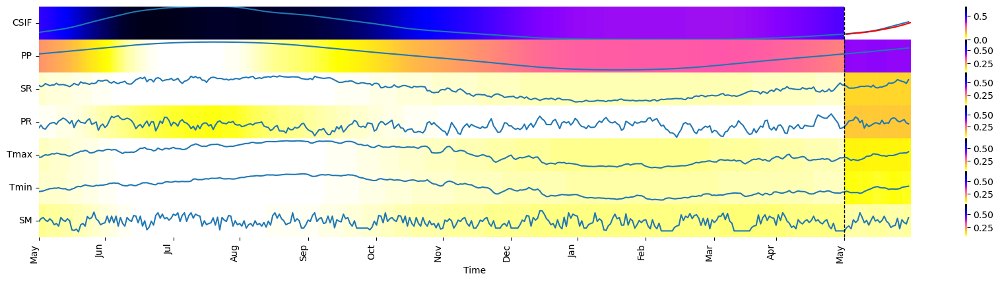

median 44.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


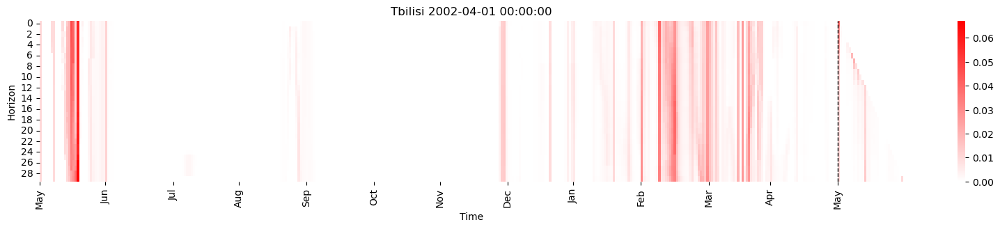

In [16]:
main_feature_map("Tbilisi")

50_20
max 50.0
min 32.5
median 43.75
mean 43.75
median 45.25
window: 2002-04-03 00:00:00 , 2002-04-06 00:00:00
[  4157   4627   5097  53497  67469  73985 140993 145661]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


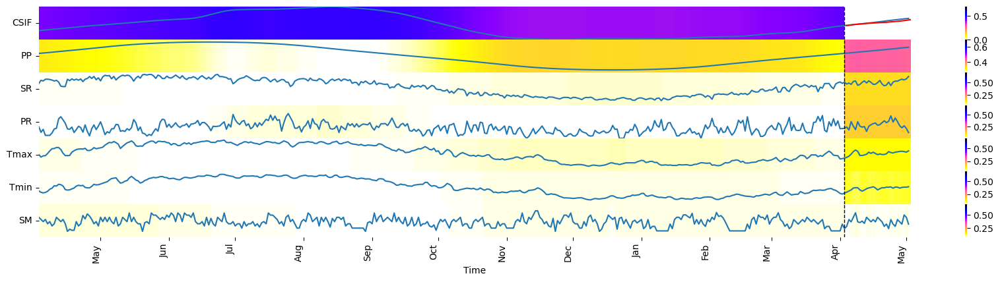

median 45.25
window: 2002-04-03 00:00:00 , 2002-04-06 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


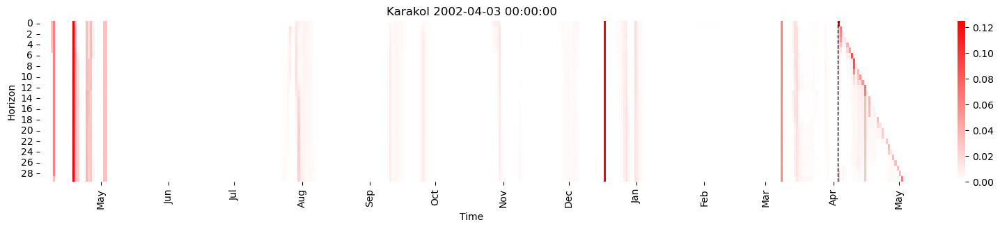

In [17]:
main_feature_map("Karakol")

max 50.0
min 32.5
median 43.75
mean 43.75
median 45.25
window: 2006-04-25 00:00:00 , 2006-04-28 00:00:00
[  4169   4639   5109  53509  67481  73997 138217 141005 145673]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


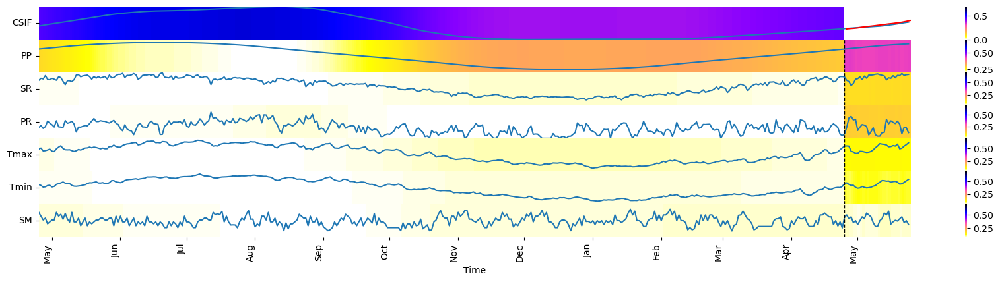

median 45.25
window: 2006-04-25 00:00:00 , 2006-04-28 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


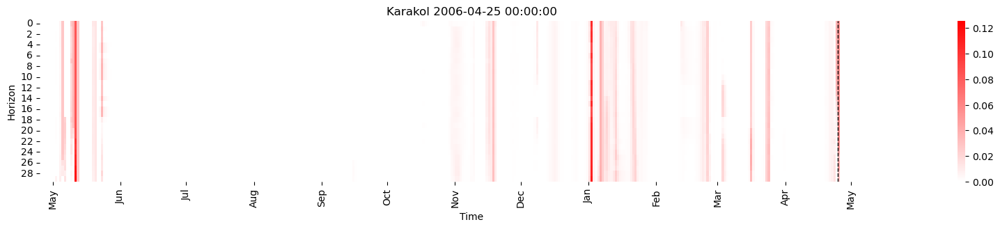

In [36]:
main_feature_map("Karakol", "BDT", "sos", 2006)

-20_-60
max -31.5
min -51.25
median -34.5
mean -34.5
median -40.25
window: 2002-10-15 00:00:00 , 2002-10-18 00:00:00
[48375 50223 54421 57679 59997 60467 60937 63255 63725 64195 64665]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


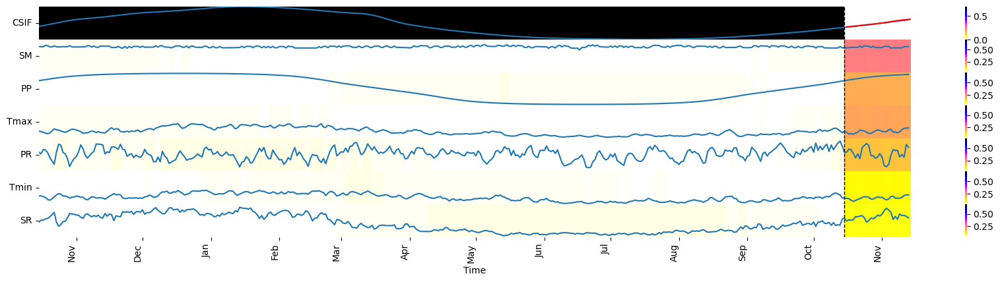

median -40.25
window: 2002-10-15 00:00:00 , 2002-10-18 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


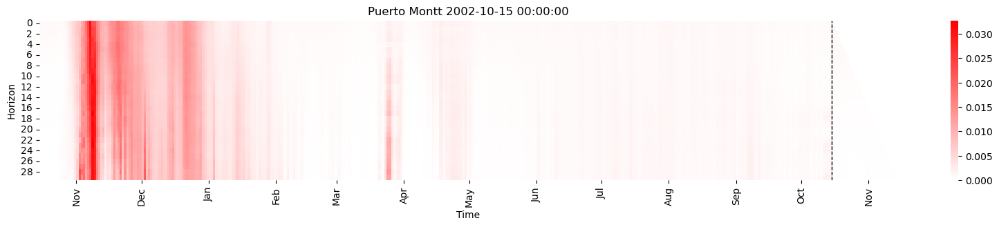

In [18]:
main_feature_map("Puerto Montt")

-20_-60
max -22.0
min -41.75
median -28.5
mean -28.5
median -32.0
window: 2002-08-20 00:00:00 , 2002-08-23 00:00:00
[40185 41595 44853 47171 48111 50429 51369 53217 54157]


/local/ipykernel_1411134/2756069451.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


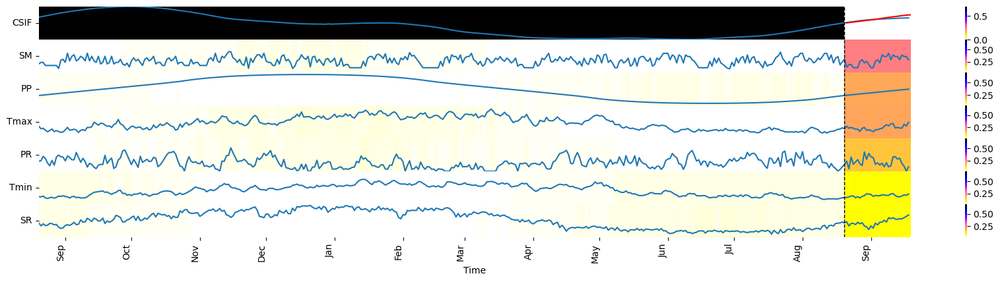

median -32.0
window: 2002-08-20 00:00:00 , 2002-08-23 00:00:00


/local/ipykernel_1411134/2756069451.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


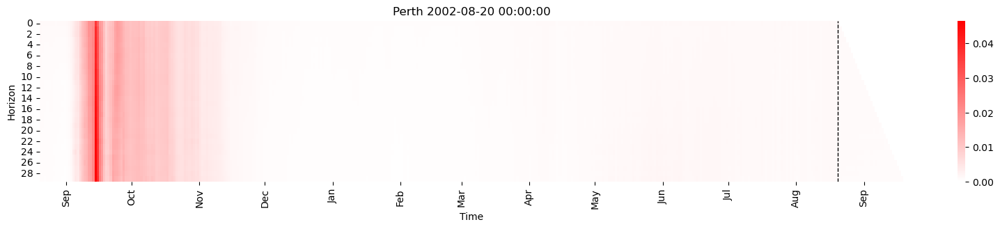

In [23]:
main_feature_map("Perth")

-20_-60
max -28.0
min -47.75
median -32.5
mean -32.5
median -33.0
window: 2002-09-15 00:00:00 , 2002-09-18 00:00:00
[37059 40317 42635 45893 49151 50091 52409 53349 56607 58925 62183]


/local/ipykernel_1411134/2598353680.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


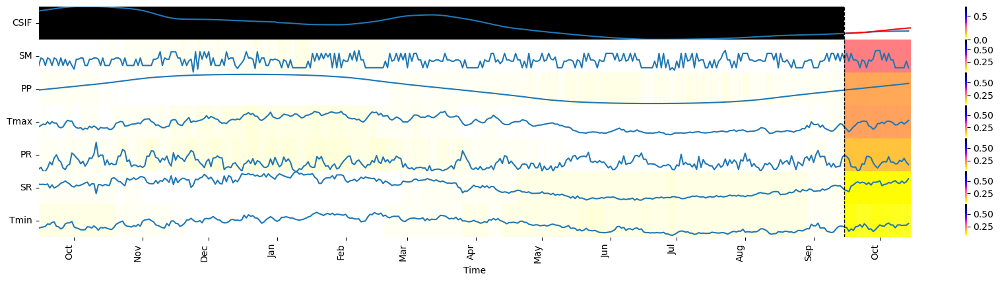

median -33.0
window: 2002-09-15 00:00:00 , 2002-09-18 00:00:00


/local/ipykernel_1411134/2598353680.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


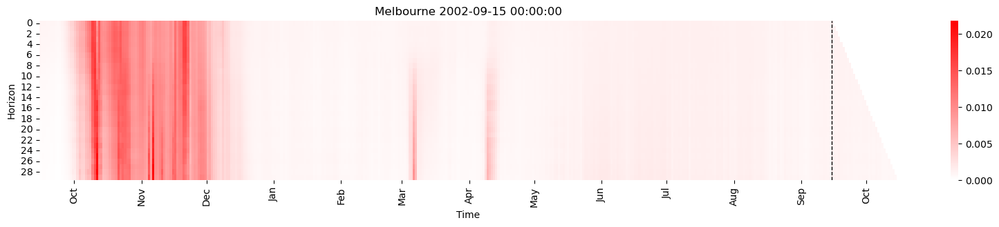

In [20]:
main_feature_map("Melbourne")

-20_-60
max -20.0
min -37.25
median -26.5
mean -26.5
median -29.25
window: 2002-08-15 00:00:00 , 2002-08-18 00:00:00
[ 2466 15028 18756 19697 21544 28060 29000 31788 32729 34576 35516 37834
 38774 41092 42503 44350 49019 50866 55535 57852 58322]


/local/ipykernel_1411134/2756069451.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


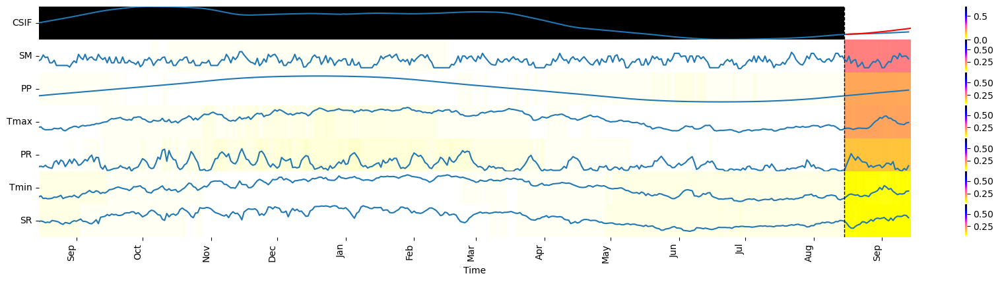

median -29.25
window: 2002-08-15 00:00:00 , 2002-08-18 00:00:00


/local/ipykernel_1411134/2756069451.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


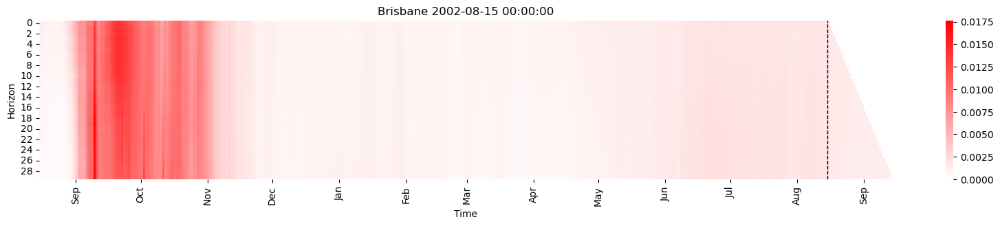

In [24]:
main_feature_map("Brisbane")

In [25]:
main_feature_map("Port Douglas")

-20_20
max -6.5
min -20.0
median -9.75
mean -9.75
median -12.75


TypeError: cannot unpack non-iterable NoneType object

max 62.0
min 50.0
median 57.25
mean 57.25
median 56.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00
[ 32365  77507  81235  84964  88692 100783 104982 113345 113815 118014
 126847 131046 139409 139879 143608 144078]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


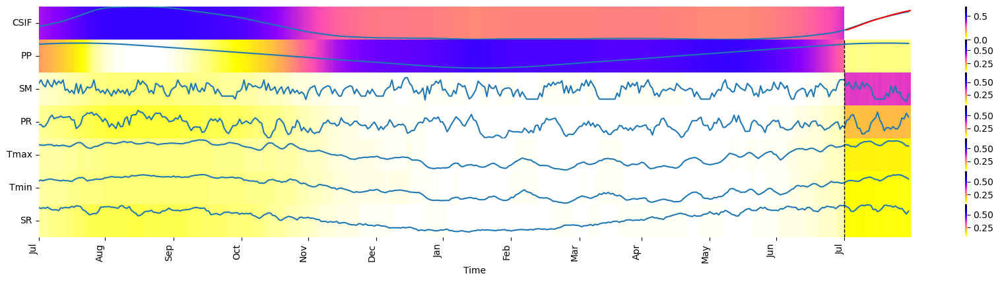

median 56.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


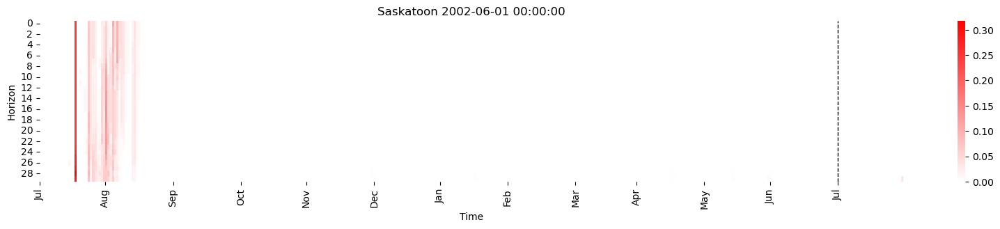

In [37]:
main_feature_map("Saskatoon", "BDT", "sos")

max 70.75
min 51.25
median 58.25
mean 58.25
median 61.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00
[  5831  13758  16546  25849  29578  31895  39822  42610  45397  48185
 117544]


/local/ipykernel_1443415/98367527.py:328: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


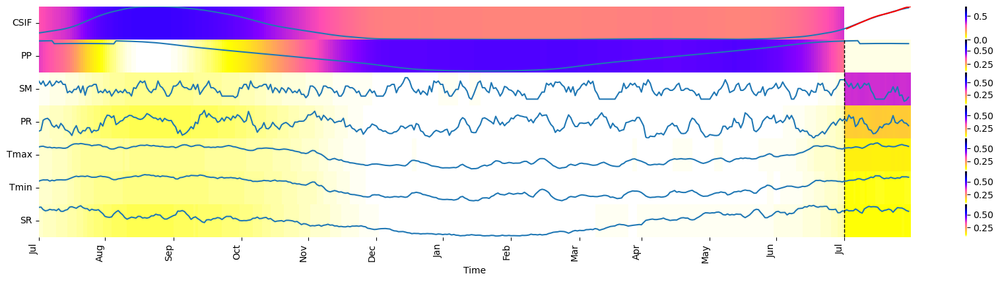

median 61.25
window: 2002-06-01 00:00:00 , 2002-06-04 00:00:00


/local/ipykernel_1443415/98367527.py:444: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


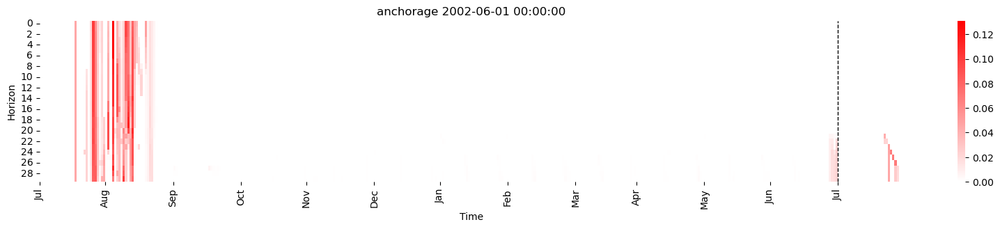

In [38]:
main_feature_map("anchorage", "BDT", "sos")

-20_20
max 20.0
min 3.75
median 10.0
mean 10.0
median 16.5
window: 2002-03-04 00:00:00 , 2002-03-07 00:00:00
[  297  4025  6342  7753 10541 11011 33347 39393 75701]


/local/ipykernel_1421826/2756069451.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


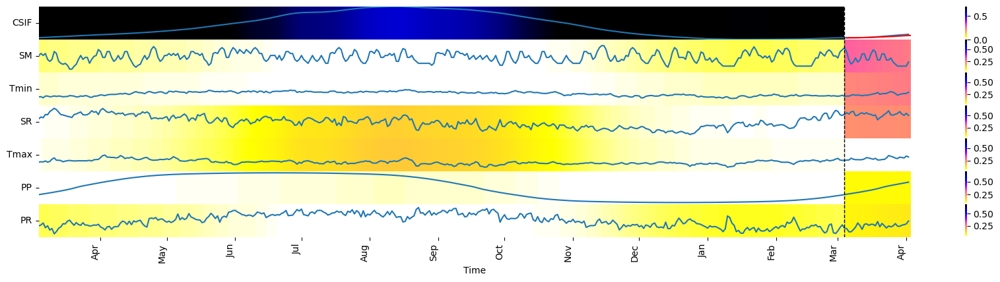

median 16.5
window: 2002-03-04 00:00:00 , 2002-03-07 00:00:00


/local/ipykernel_1421826/2756069451.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


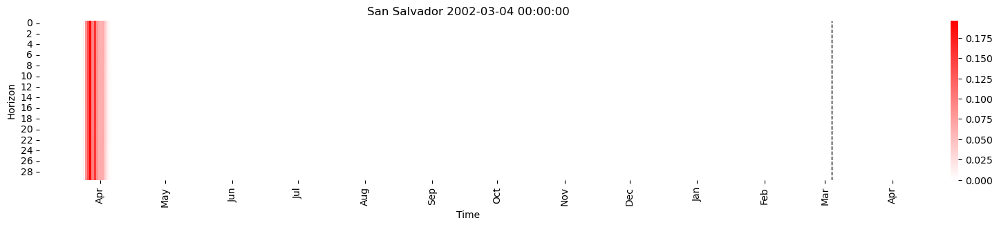

In [4]:
main_feature_map("San Salvador")

50_20
max 35.75
min 20.0
median 34.5
mean 34.5
median 34.5
window: 2002-02-15 00:00:00 , 2002-02-18 00:00:00
[131928 133338 136126 138914 139384 141702 143112 145430 146370 148218]


/local/ipykernel_1421826/2756069451.py:299: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


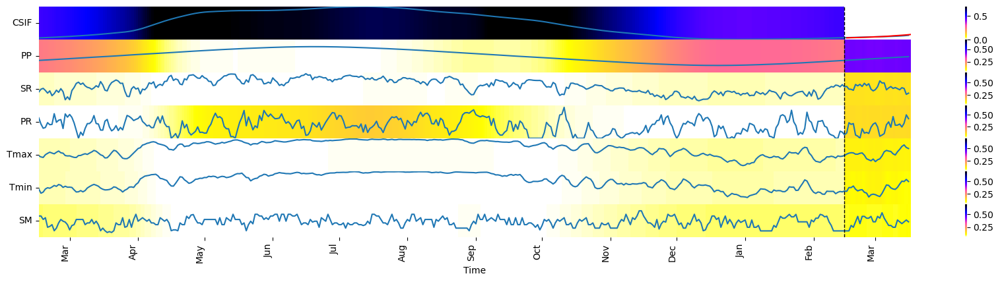

median 34.5
window: 2002-02-15 00:00:00 , 2002-02-18 00:00:00


/local/ipykernel_1421826/2756069451.py:403: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  date_range = pd.date_range(start=window_start, periods=len(first_day_of_months)+1, freq='M')


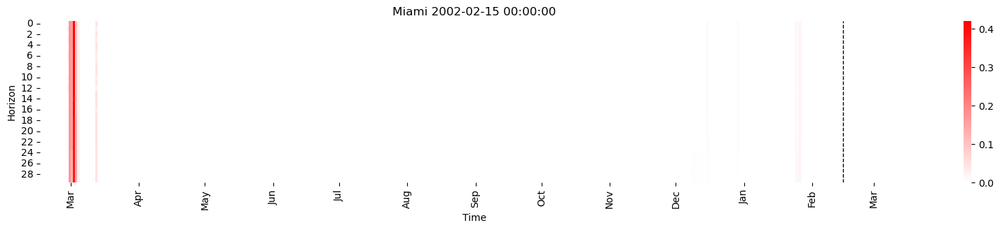

In [5]:
main_feature_map("Miami")

# not important

/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max -10.25
min -47.0
median -15.5
mean -15.5
median -15.5
window: 2006-08-15 00:00:00 , 2006-08-18 00:00:00
[128501 128971 129441 129911 131759 132229 132699 133169 135017 135487
 135957 136427 138275 138745 139215 139685 141533 142003 142473 142943
 144791 145261 145731 146201 148049]


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

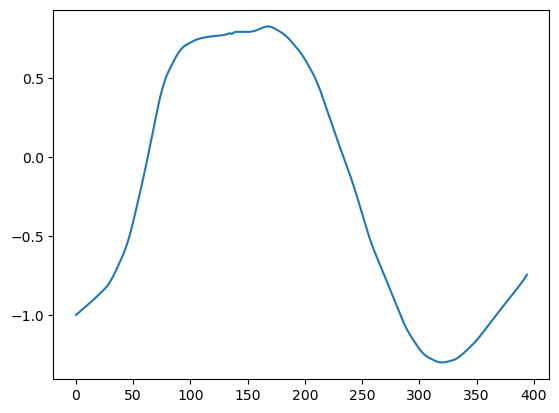

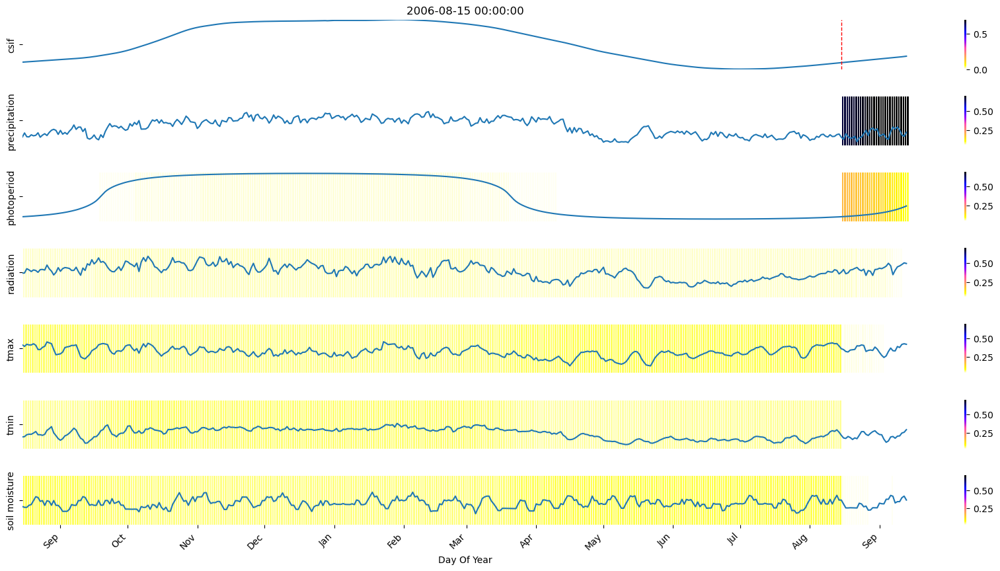

In [4]:
# main

data_path = "/burg/glab/users/al4385/data/TFT_30/BET.pickle"
pred_path = "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_BET.pkl"
coord_path = "/burg/glab/users/al4385/data/coordinates/BET.parquet"

latitude_range = (-80, -10)
longitude_range = (-180, 180)

df = get_analysis_df(data_path, pred_path, coord_path)
df = localize_df(df, latitude_range, longitude_range)
plot_featimp(df, pred_path, data_path, specific_year=2006, title="")

In [ ]:
plot_featimp(df, pred_path, specific_year=2006, title="")

In [5]:
def plot_attention(df, pred_path, specific_year=2006, title=" "):
    with open(pred_path, "rb") as fp:
        preds = pickle.load(fp)
    select_indices, window_start = find_date_range(df, specific_year)
    att_mat_list = []
    for index in select_indices:
        att_mat_list.append(preds["attention_scores"][index])
    stacked_att = np.stack(att_mat_list, axis=0)
    att_mean_array = np.mean(stacked_att, axis=0)

    plt.figure(figsize=(20, 3))
    cmap0 = LinearSegmentedColormap.from_list("", ["white", "red"])
    sns.heatmap(
        att_mean_array, cmap=cmap0
    )  # You can choose different colormaps like 'coolwarm', 'Blues', etc.
    plt.axvline(x=365, color="black", linestyle="--", linewidth=1)
    # Adding titles and labels as needed
    plt.xlabel("Index relative to first prediction point")
    plt.ylabel("Horizon")
    # Set the x-axis tick positions
    tick_positions = range(0, 396)[::5]
    # Set the custom tick labels
    custom_tick_labels = range(-365, 31)[::5]
    # Set the tick labels
    plt.xticks(tick_positions, custom_tick_labels)
    plt.title(title + " " + str(window_start))

    # Show the plot
    plt.savefig(
        "feature_importance_plots/attention" + title + ".png", format="png", dpi=300
    )

    plt.show()

median -15.5
window: 2006-08-15 00:00:00 , 2006-08-18 00:00:00


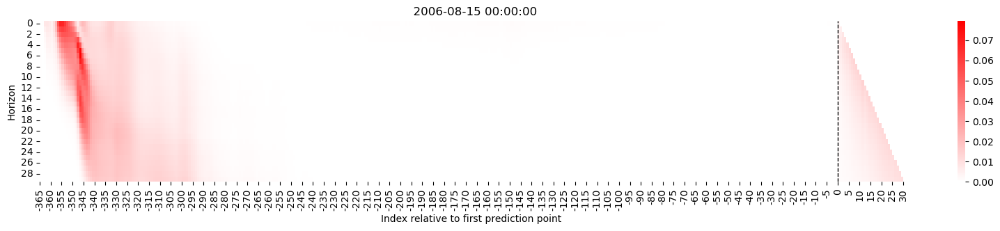

In [6]:
plot_attention(df, pred_path, specific_year=2006)

In [ ]:
data_path = "/burg/glab/users/al4385/data/TFT_30/BET.pickle"
pred_path = "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_BET.pkl"
coord_path = "/burg/glab/users/al4385/data/coordinates/BET.parquet"

latitude_range = (-80, -10)
longitude_range = (-180, 180)

df = get_analysis_df(data_path, pred_path, coord_path)
df = localize_df(df, latitude_range, longitude_range)
plot_featimp(df, pred_path, specific_year=2006, title="")

In [3]:
get_city_bounding_box("Vancouver")

((39.2608724, 59.2608724), (-143.11395199999998, -103.113952))

In [ ]:
city = "Algiers"
latitude_range, longitude_range = get_city_bounding_box(city)
data_path = "/burg/glab/users/al4385/data/TFT_30/BDT_50_20.pickle"
pred_path = "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_BDT_50_20.pkl"
coord_path = "/burg/glab/users/al4385/data/coordinates/BDT_50_20.parquet"
df = get_analysis_df(data_path, pred_path, coord_path)
df = localize_df(df, latitude_range, longitude_range)
plot_featimp(df, pred_path, specific_year=None, title=city)

In [6]:
city = "Algiers"
latitude_range, longitude_range = get_city_bounding_box(city)
lat_range_path = check_latitude_interval(latitude_range)
data_path = "/burg/glab/users/al4385/data/TFT_30/BDT_" + lat_range_path + ".pickle"
pred_path = (
    "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_BDT_"
    + lat_range_path
    + ".pkl"
)
coord_path = (
    "/burg/glab/users/al4385/data/coordinates/BDT_" + lat_range_path + ".parquet"
)
df = get_analysis_df(data_path, pred_path, coord_path)
df = localize_df(df, latitude_range, longitude_range)
plot_featimp(df, pred_path, specific_year=None, title=city)

/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max 46.75
min 27.0
median 41.25
mean 41.25


TypeError: plot_featimp() missing 1 required positional argument: 'data_path'

In [6]:
def main_feature_map(city, pft):
    latitude_range, longitude_range = get_city_bounding_box(city)
    lat_range_path = check_latitude_interval(latitude_range)
    print(lat_range_path)
    data_path = "/burg/glab/users/al4385/data/TFT_30/BDT_" + lat_range_path + ".pickle"
    pred_path = (
        "/burg/glab/users/al4385/predictions/TFT_30_0429/pred_BDT_"
        + lat_range_path
        + ".pkl"
    )
    coord_path = (
        "/burg/glab/users/al4385/data/coordinates/BDT_" + lat_range_path + ".parquet"
    )
    df = get_analysis_df(data_path, pred_path, coord_path)
    df = localize_df(df, latitude_range, longitude_range)
    plot_featimp(df, pred_path, data_path, specific_year=None, title=city)
    plot_attention(df, pred_path, specific_year=None, title=city)

In [7]:
main_feature_map("Vancouver")

50_20


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max 50.0
min 39.5
median 45.75
mean 45.75
median 48.5


TypeError: cannot unpack non-iterable NoneType object

In [ ]:
main_feature_map("New york city")

50_90


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max 65.5
min 50.0
median 58.0
mean 58.0
median 58.5
window: 2002-04-15 00:00:00 , 2002-04-18 00:00:00
[ 13057  14467  19573  20043  22831  23301  26559  27029  30287  30757
  32605  33075  35863  40531  43319  43789  46107  46577  48895  49365
  52153  74959  78217  78687  81945  82415  85673  86143  89401  97765
  98235 101493 101963 102433 105691 110797 114525 114995 118723 123829
 127557 128027 128497 136861 137331 140589 141059 141529 144787]


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

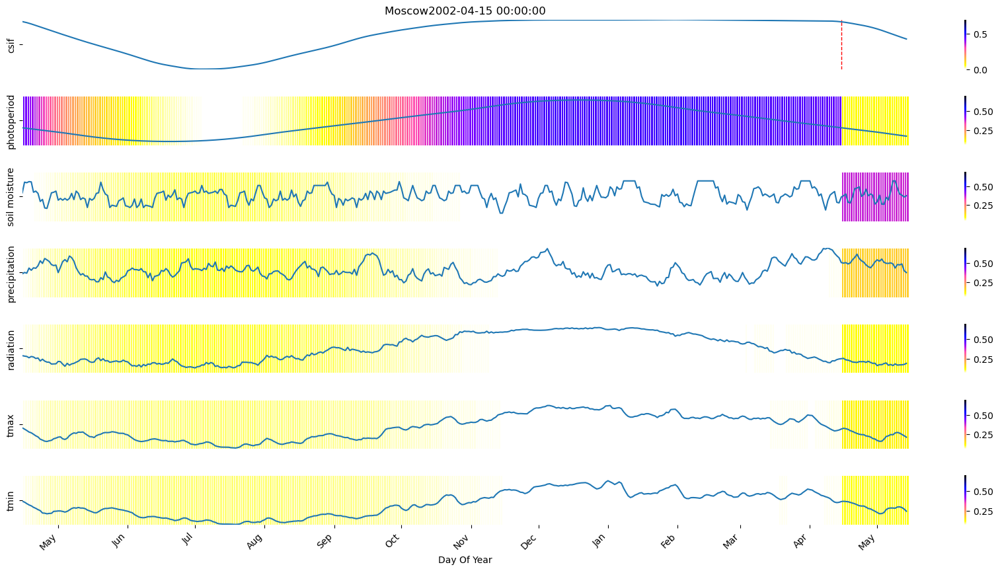

median 58.5
window: 2002-04-15 00:00:00 , 2002-04-18 00:00:00


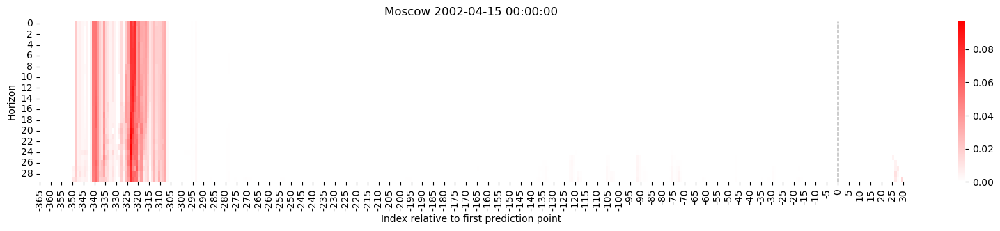

In [10]:
main_feature_map("Moscow")

50_20


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max 46.75
min 27.0
median 41.25
mean 41.25
median 42.75
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[ 50239  52557  53027  55344  60013  61860  62331  66529  68847  69317
  73045  75363  75833  78150  82819  84666  85137  88865  94911 101897
 104214 107943 114459 117717 120504 121915 124703]


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

ValueError: Columns must be same length as key

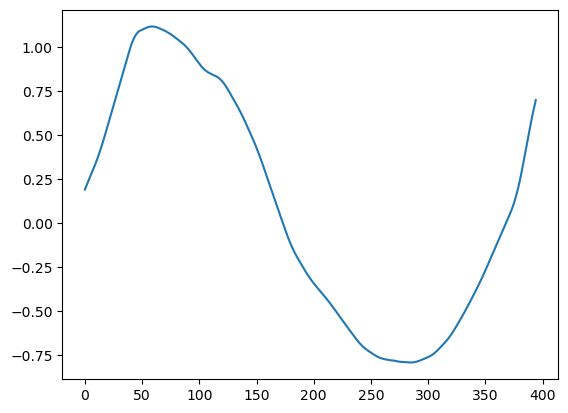

<Figure size 1700x900 with 0 Axes>

In [7]:
main_feature_map("Algiers")

50_90


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max 65.5
min 50.0
median 58.0
mean 58.0
median 58.5
window: 2002-04-15 00:00:00 , 2002-04-18 00:00:00
[ 13057  14467  19573  20043  22831  23301  26559  27029  30287  30757
  32605  33075  35863  40531  43319  43789  46107  46577  48895  49365
  52153  74959  78217  78687  81945  82415  85673  86143  89401  97765
  98235 101493 101963 102433 105691 110797 114525 114995 118723 123829
 127557 128027 128497 136861 137331 140589 141059 141529 144787]


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

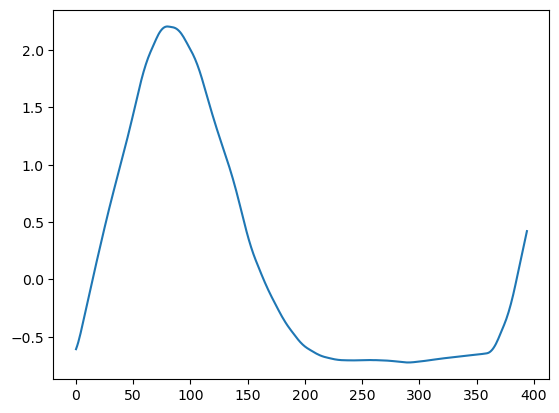

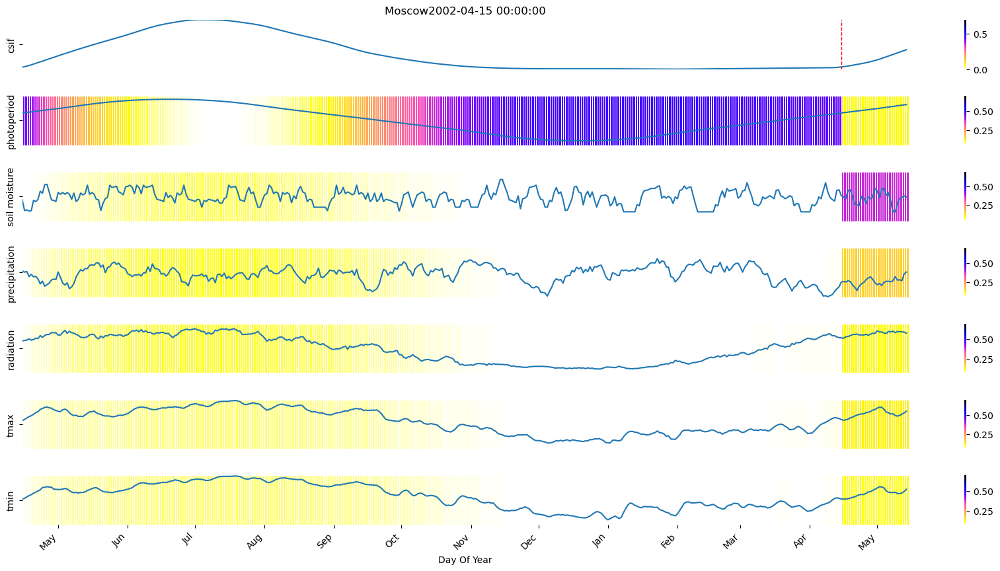

median 58.5
window: 2002-04-15 00:00:00 , 2002-04-18 00:00:00


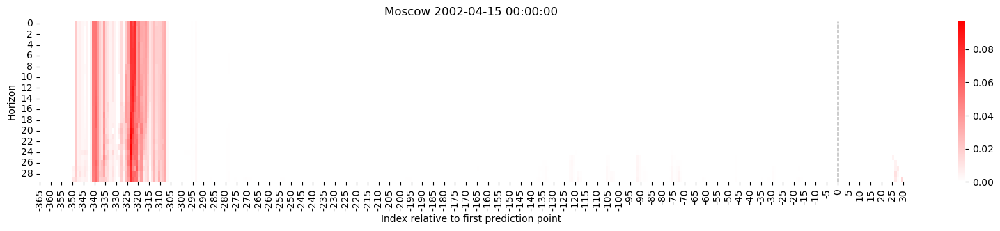

In [23]:
main_feature_map("Moscow")

In [24]:
main_feature_map("Jakarta")

-20_20


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max 3.75
min -16.0
median -7.25
mean -7.25
median -15.0


TypeError: cannot unpack non-iterable NoneType object

In [25]:
main_feature_map("Perth")

-20_-60


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max -22.0
min -41.75
median -28.5
mean -28.5
median -32.0


TypeError: cannot unpack non-iterable NoneType object

-20_-60


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max -24.75
min -44.5
median -30.5
mean -30.5
median -29.5
window: 2002-08-15 00:00:00 , 2002-08-18 00:00:00
[22955 24802 25742 28530 29471 31318 32258 35046 35987 38304 42032 45290
 47608 48548 51806 55064 57382 58793 60640 61110 62051]


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

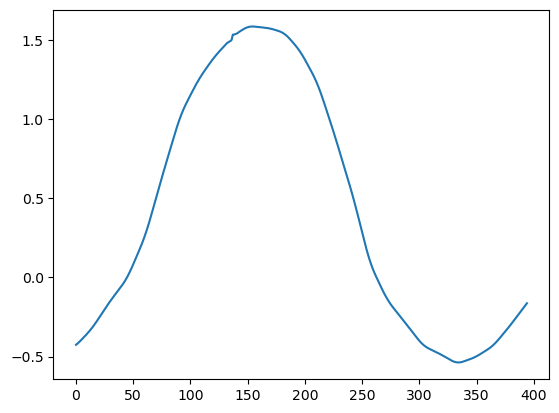

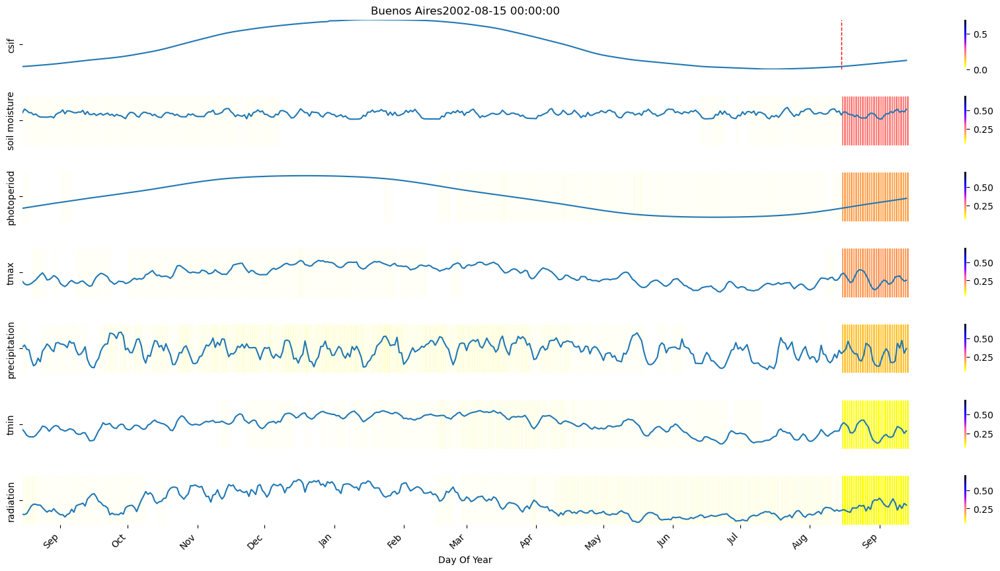

median -29.5
window: 2002-08-15 00:00:00 , 2002-08-18 00:00:00


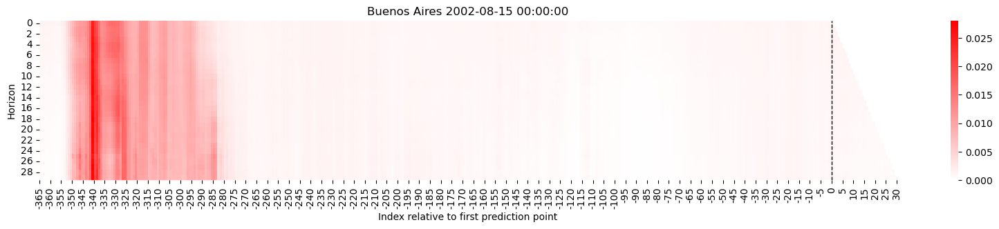

In [26]:
main_feature_map("Buenos Aires")

In [27]:
main_feature_map("Cape Town")

-20_-60


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max -24.0
min -43.75
median -30.0
mean -30.0
median -28.0


TypeError: cannot unpack non-iterable NoneType object

50_20


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

max 50.0
min 30.25
median 43.75
mean 43.75
median 42.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00
[  6474   9732  12990  13461  16248  16719  19977  23235  26493  29751
  32538  35796  43253  56285  69787  72105  76303  81408  91653  95851
  98169 114929 131219 134007 137265 140052 141463 143781 144721 147039
 147979]


/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator QuantileTransformer from version 1.4.1.post1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/burg/opt/anaconda3-2023.09/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.

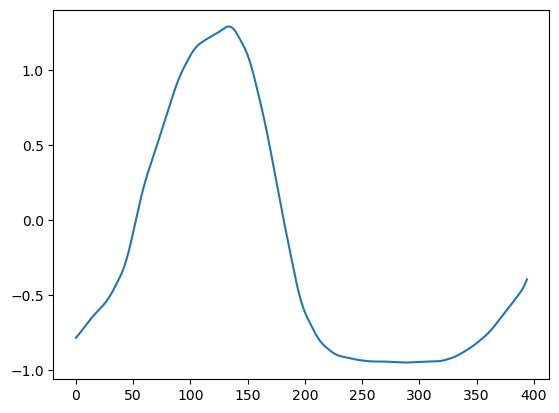

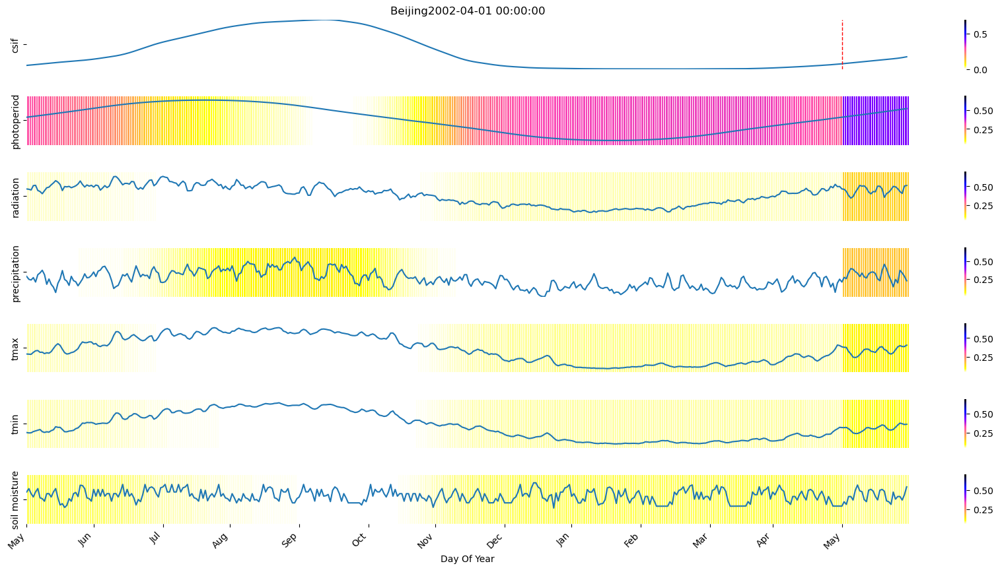

median 42.5
window: 2002-04-01 00:00:00 , 2002-04-04 00:00:00


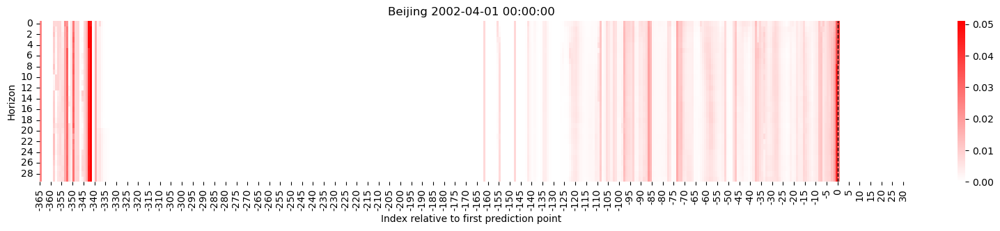

In [7]:
main_feature_map("Beijing")